In [1]:
from numba.core.errors import NumbaDeprecationWarning, NumbaPendingDeprecationWarning
import warnings

warnings.simplefilter('ignore', category=NumbaDeprecationWarning)
warnings.simplefilter('ignore', category=NumbaPendingDeprecationWarning)

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
from harmony import harmonize
from anndata import AnnData
import anndata
from sklearn.utils import shuffle
import copy
import matplotlib.pyplot as plt
import xgboost as xgb
import anndata as ad
import importlib
import PlotConfusion as pc
importlib.reload(pc)
import PlotConfusion as pc
import matplotlib
import scipy.stats as stats

sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.24.3 scipy==1.10.1 pandas==2.0.2 scikit-learn==1.2.2 statsmodels==0.14.0 python-igraph==0.10.4 louvain==0.8.0 pynndescent==0.5.10


In [3]:
new_rc_params = {'text.usetex': False,
"svg.fonttype": 'none'
}
matplotlib.rcParams.update(new_rc_params)
plt.rcParams.update({'axes.labelsize' : 16}) 

In [4]:
def run_umap(adata):
    sc.pp.scale(adata, max_value=10)
    sc.tl.pca(adata, svd_solver='arpack')
    Z = harmonize(adata.obsm['X_pca'], adata.obs, batch_key = 'Batch')
    adata.obsm['X_harmony'] = Z
    sc.pp.neighbors(adata, n_neighbors=15, use_rep='X_harmony', knn=True)
    sc.tl.umap(adata)

In [5]:
DS_markers = ['Col25a1', 'Cartpt', 'Neurod2', 'Mmp17', 'Tafa4', 'Piezo2', 'Ptprt', 'Gpr88', 'Ptprk', 'Tbx5', 'Sfrp1', 'Fibcd1', 'Calb1', 'Calb2']

In [6]:
adata_p7 = sc.read_h5ad('adatas/P7_adata_pruned.h5ad')
adata_p7b2 = sc.read_h5ad('adatas/P7b2_adata_pruned.h5ad')

In [11]:
C_types = []
for i in adata_p7.obs['P56_type']:
    C_types.append('C' + str(i))
adata_p7.obs['C_type'] = pd.Categorical(C_types)

In [12]:
C_types = []
for i in adata_p7b2.obs['P56_type']:
    C_types.append('C' + str(i))
adata_p7b2.obs['C_type'] = pd.Categorical(C_types)

In [59]:
adata_combined = ad.concat([adata_p7, adata_p7b2], label='Condition', keys=['Control', 'β2-KO'])

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\anndata\_core\anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [60]:
adata_combined_DS = adata_combined[adata_combined.obs['C_type'].isin(['C12', 'C16', 'C24', 'C10'])]

In [61]:
sc.pp.scale(adata_combined_DS, max_value=10)

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [62]:
sc.tl.pca(adata_combined_DS, svd_solver='arpack')

computing PCA
    with n_comps=50
    finished (0:00:00)


In [63]:
Z = harmonize(adata_combined_DS.obsm['X_pca'], adata_combined_DS.obs, batch_key = 'Condition')
adata_combined_DS.obsm['X_harmony'] = Z

	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
Reach convergence after 6 iteration(s).


In [64]:
sc.pp.neighbors(adata_combined_DS, n_neighbors=15, use_rep='X_harmony', knn=True)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [65]:
sc.tl.umap(adata_combined_DS)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_utils.py:430: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


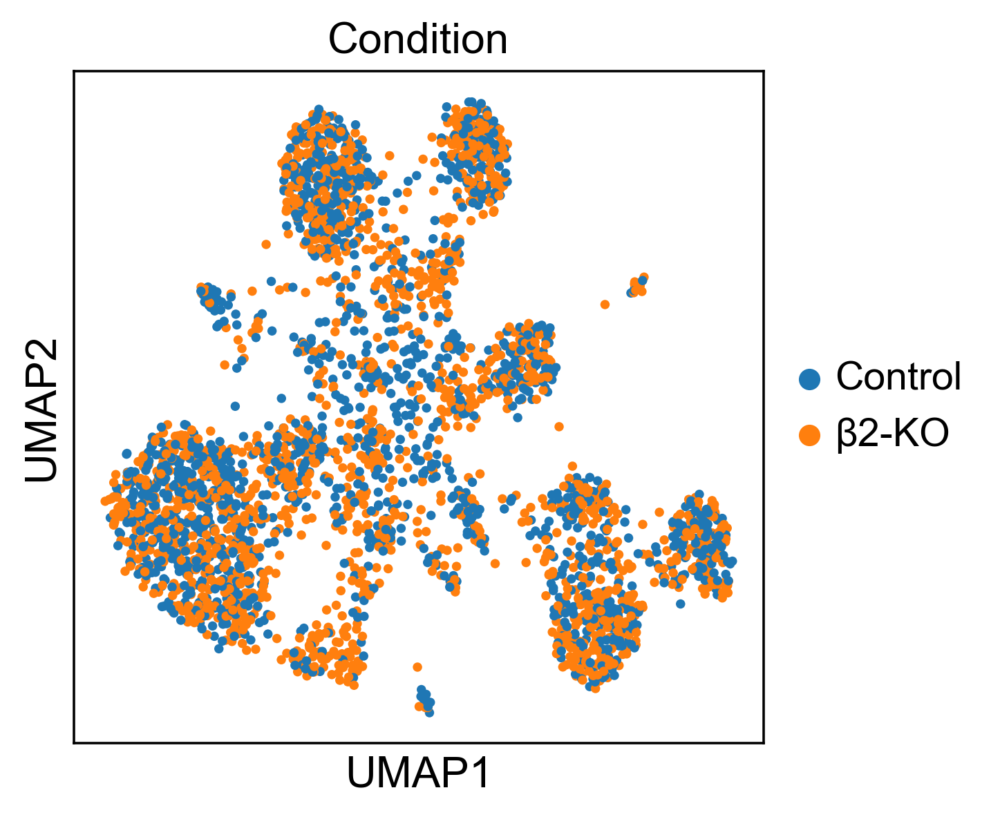

In [66]:
sc.set_figure_params(dpi=160,dpi_save=1000)
sc.pl.umap(shuffle(adata_combined_DS), color=['Condition'], title='Condition')

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


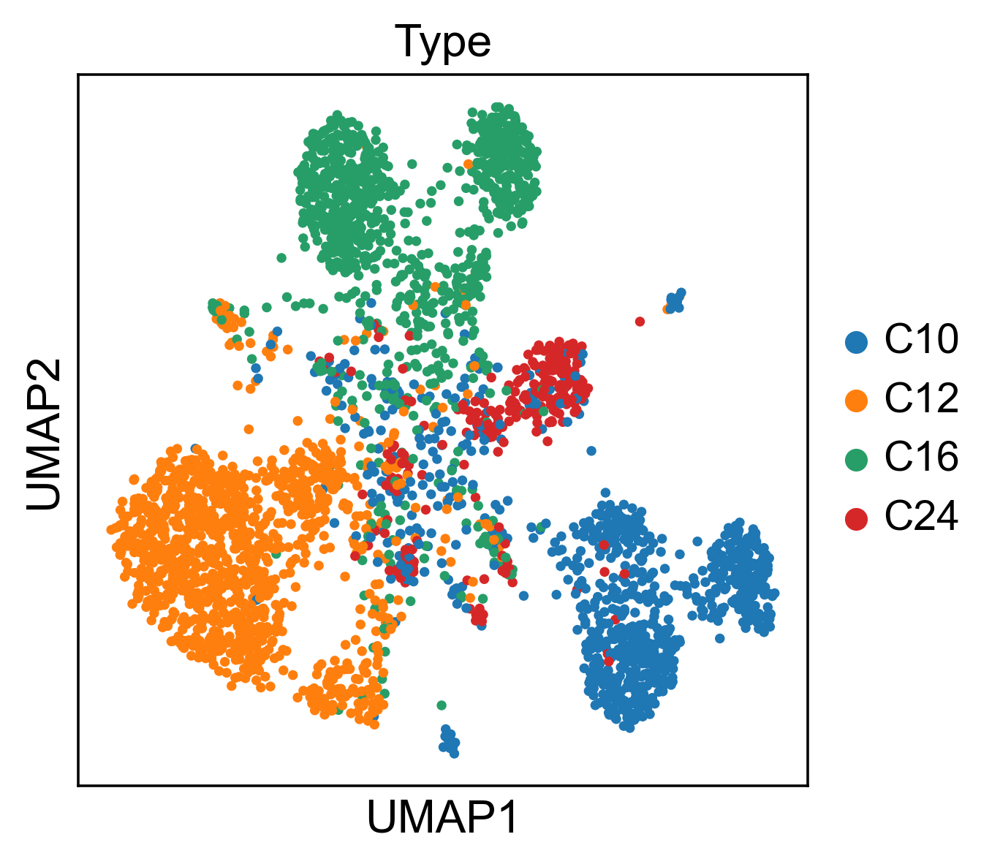

In [67]:
sc.set_figure_params(dpi=160,dpi_save=1000)
sc.pl.umap(adata_combined_DS, color=['C_type'], title='Type')

In [68]:
adata_C12 = adata_combined_DS[adata_combined_DS.obs['C_type'] == 'C12']

In [69]:
run_umap(adata_C12)

computing PCA
    with n_comps=50


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


In [70]:
sc.tl.leiden(adata_C12)

running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


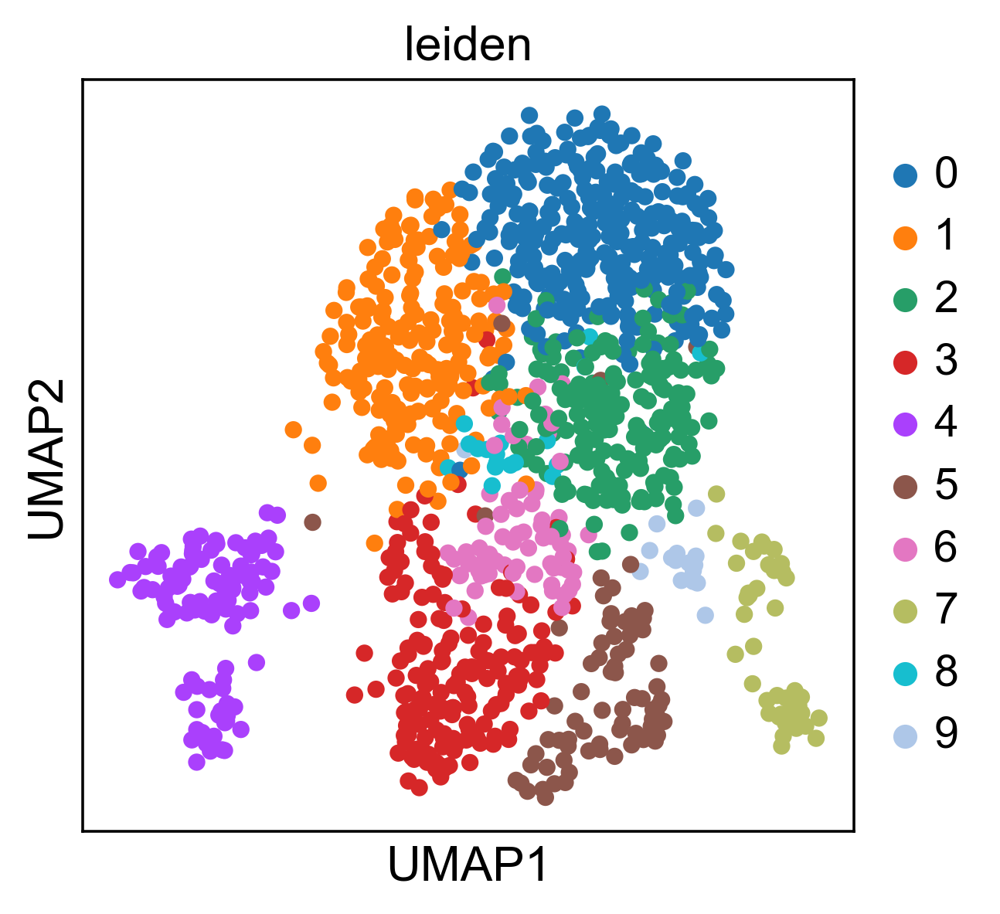

In [71]:
sc.pl.umap(adata_C12, color='leiden')

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


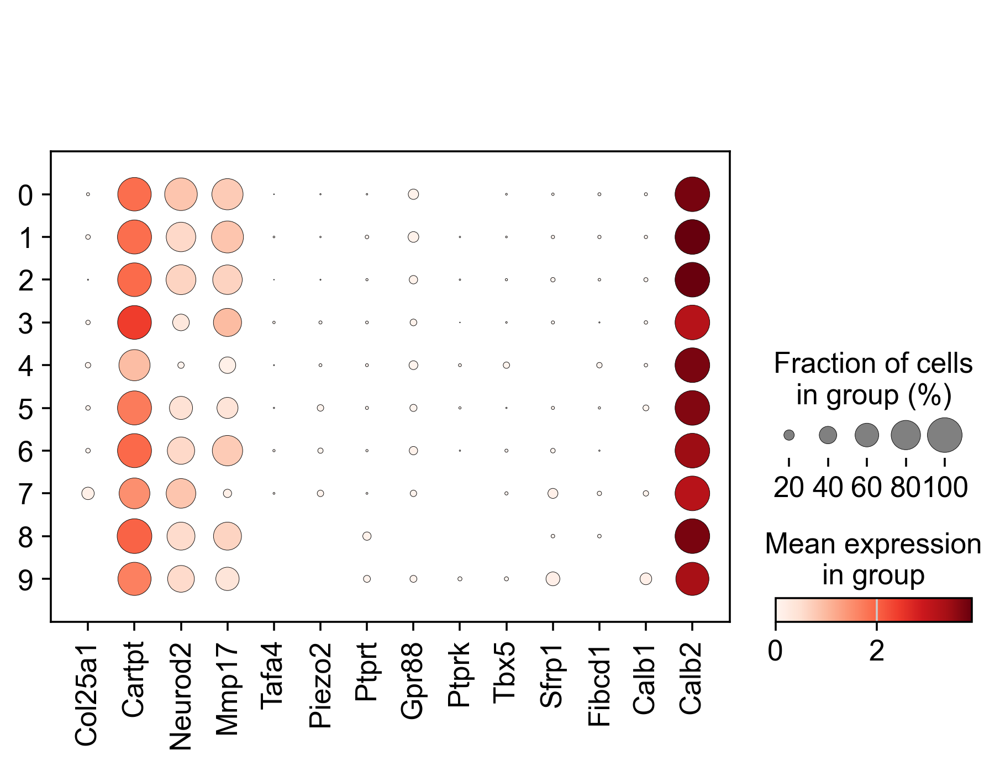

In [72]:
sc.pl.dotplot(adata_C12, DS_markers, 'leiden')

In [73]:
prune_barcodes = list(adata_C12[adata_C12.obs['leiden'].isin(['4','7'])].obs.index)

In [74]:
adata_C16 = adata_combined_DS[adata_combined_DS.obs['C_type'] == 'C16']

In [75]:
run_umap(adata_C16)

computing PCA
    with n_comps=50


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
Reach convergence after 7 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


In [76]:
sc.tl.leiden(adata_C16)

running Leiden clustering
    finished: found 8 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


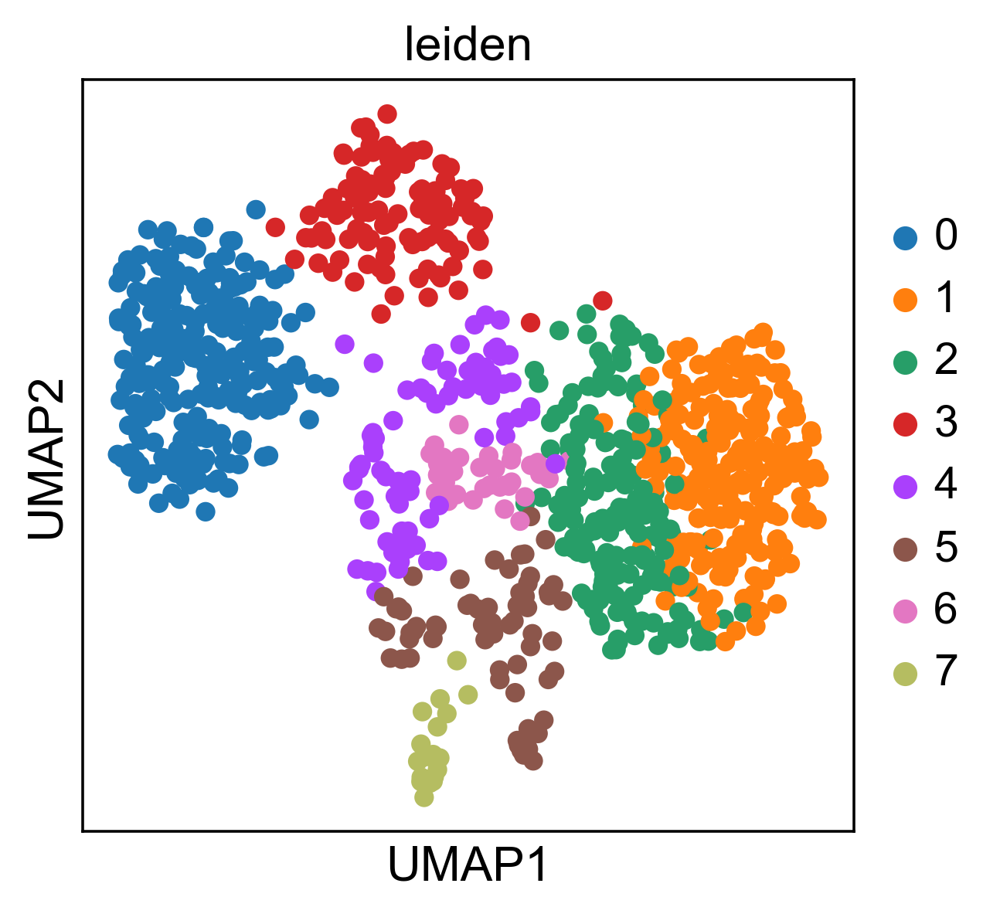

In [77]:
sc.pl.umap(adata_C16, color='leiden')

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


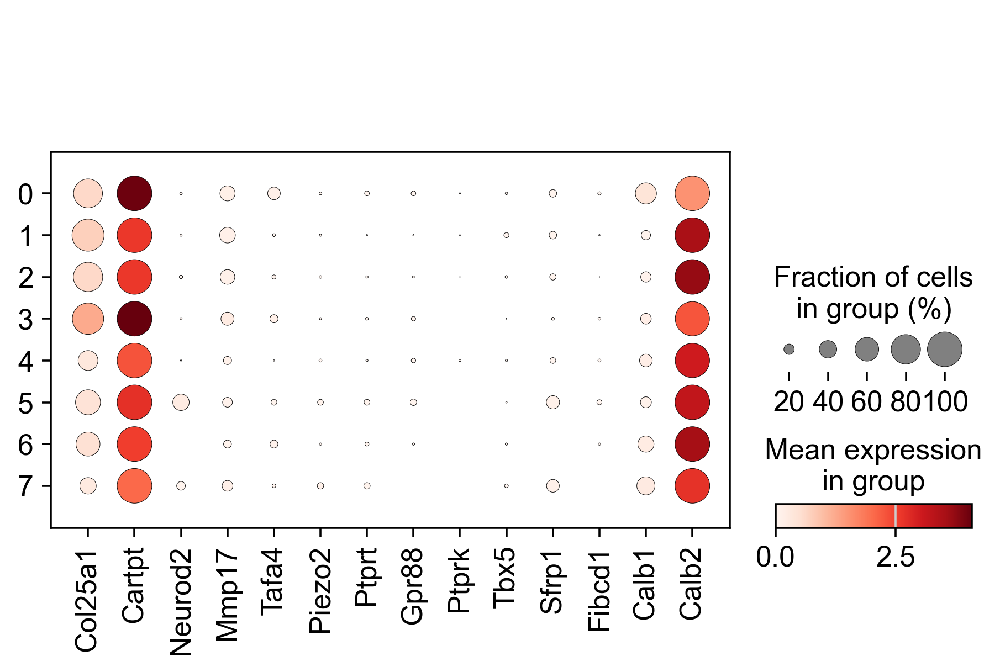

In [78]:
sc.pl.dotplot(adata_C16, DS_markers, 'leiden')

In [79]:
prune_barcodes += list(adata_C16[adata_C16.obs['leiden'].isin(['7'])].obs.index)

In [80]:
adata_C24 = adata_combined_DS[adata_combined_DS.obs['C_type'] == 'C24']

In [81]:
run_umap(adata_C24)

computing PCA
    with n_comps=50


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
Reach convergence after 4 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


In [82]:
sc.tl.leiden(adata_C24)

running Leiden clustering
    finished: found 7 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


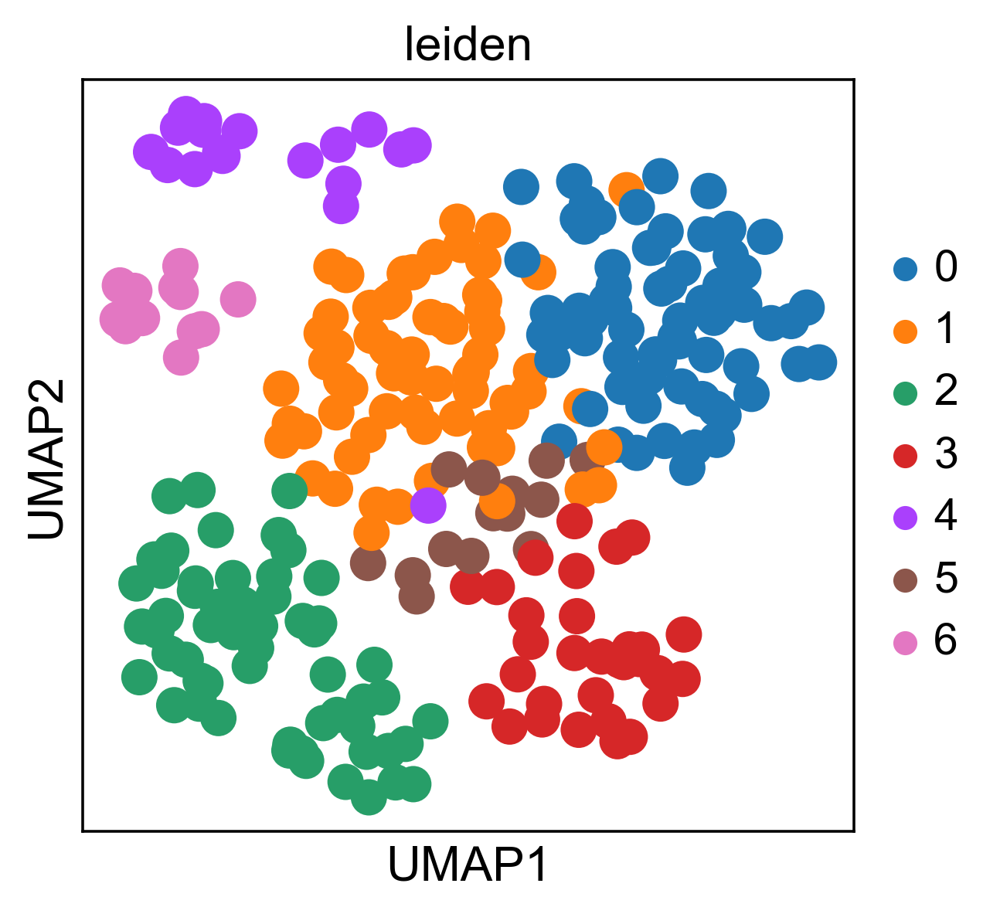

In [83]:
sc.pl.umap(adata_C24, color='leiden')

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


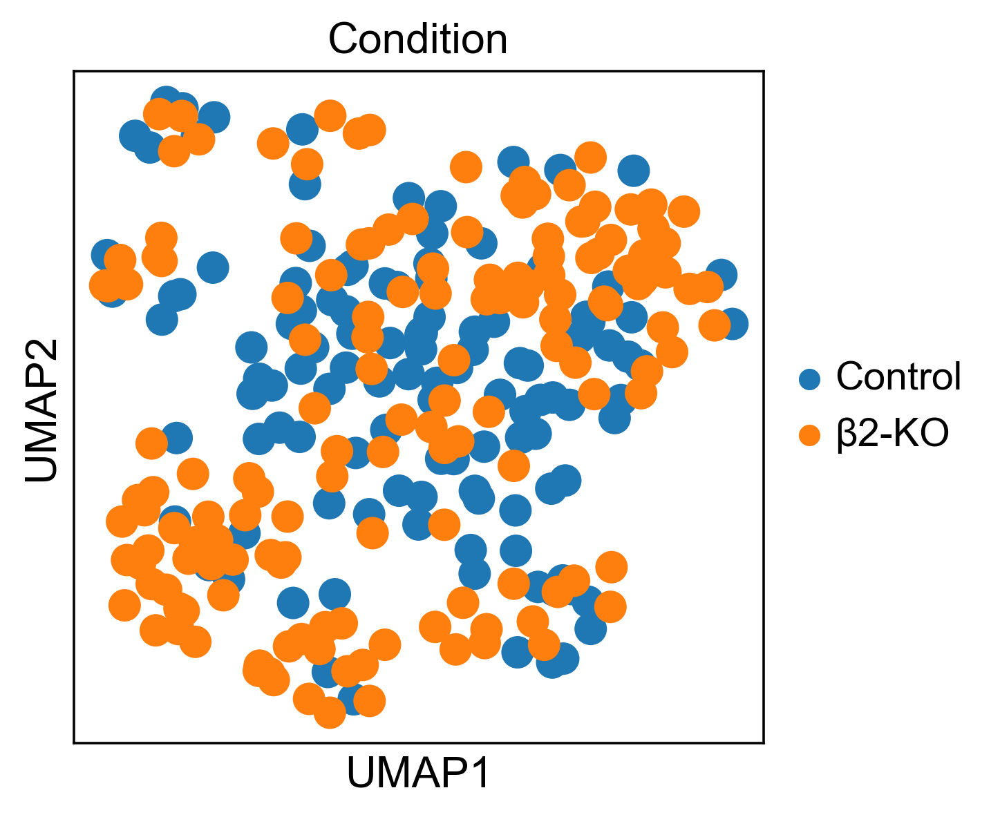

In [84]:
sc.pl.umap(adata_C24, color='Condition')

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


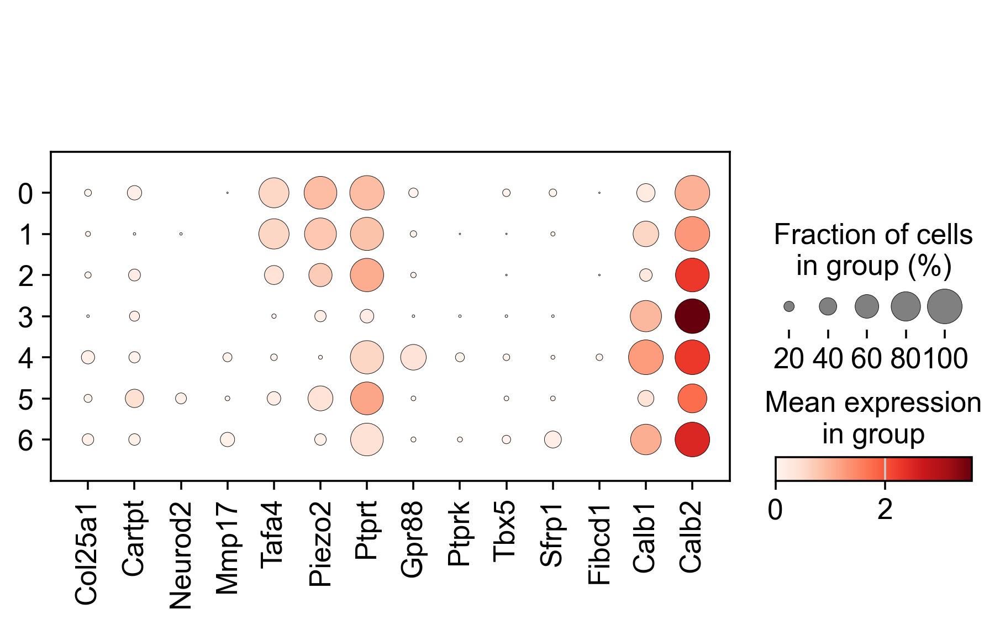

In [85]:
sc.pl.dotplot(adata_C24, DS_markers, 'leiden')

In [86]:
prune_barcodes += list(adata_C24[adata_C24.obs['leiden'].isin(['3', '4', '5', '6'])].obs.index)

In [87]:
adata_C10 = adata_combined_DS[adata_combined_DS.obs['C_type'] == 'C10']

In [88]:
run_umap(adata_C10)

computing PCA
    with n_comps=50


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
Reach convergence after 9 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


In [89]:
sc.tl.leiden(adata_C10)

running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


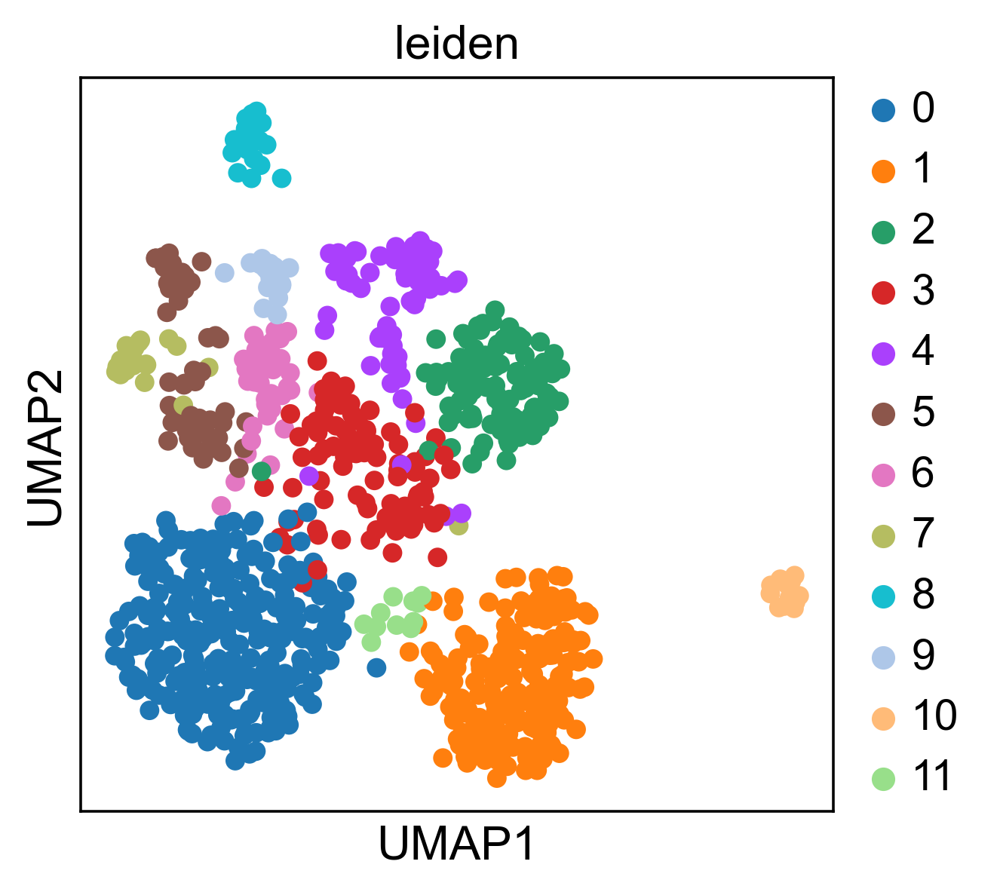

In [90]:
sc.pl.umap(adata_C10, color='leiden')

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


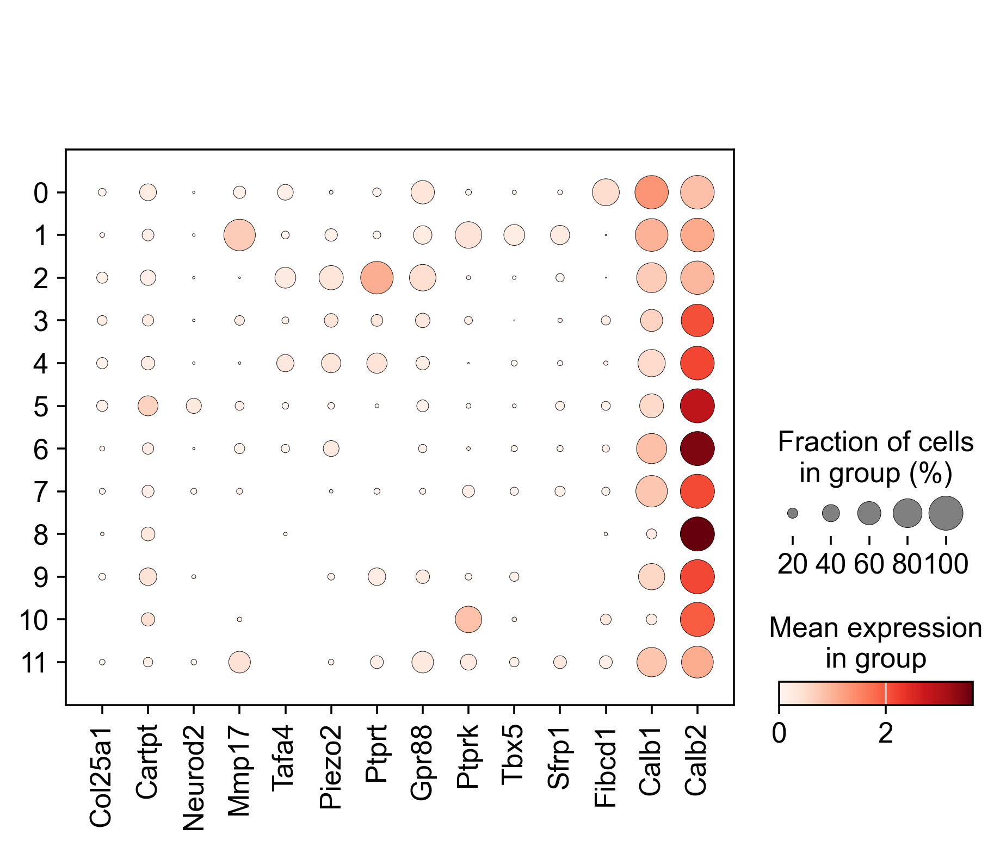

In [91]:
sc.pl.dotplot(adata_C10, DS_markers, 'leiden')

In [92]:
prune_barcodes += list(adata_C10[adata_C10.obs['leiden'].isin(['3', '4', '5', '6', '7', '8', '9', '10'])].obs.index)

In [93]:
adata_combined_DS_pruned = adata_combined_DS[~adata_combined_DS.obs.index.isin(prune_barcodes)]

In [94]:
run_umap(adata_combined_DS_pruned)

computing PCA
    with n_comps=50


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).
Reach convergence after 10 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


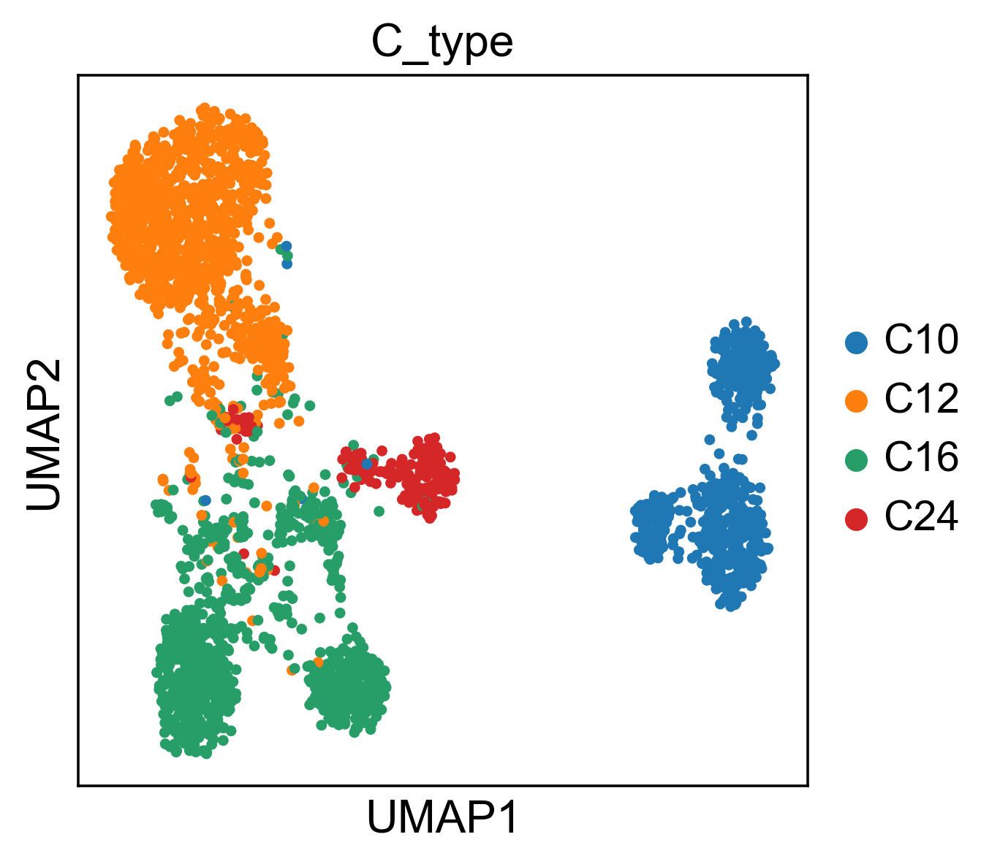

In [95]:
sc.pl.umap(adata_combined_DS_pruned, color='C_type')

In [96]:
sc.tl.leiden(adata_combined_DS_pruned)

running Leiden clustering
    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


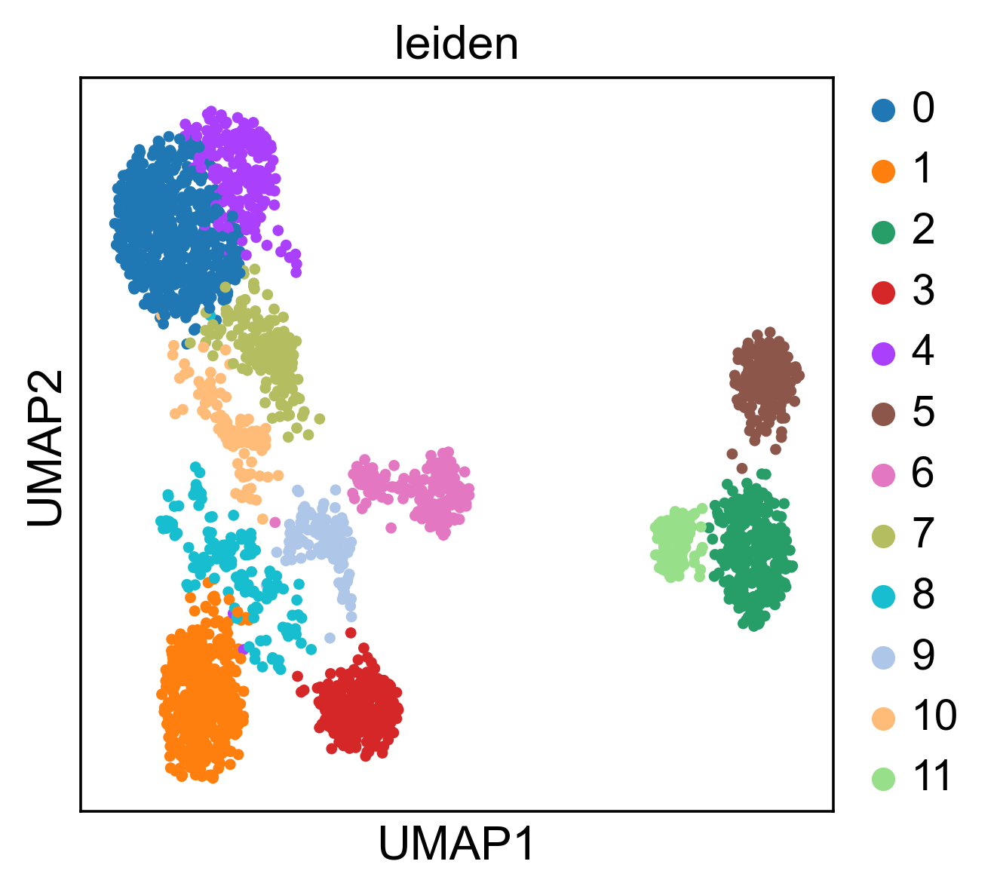

In [97]:
sc.pl.umap(adata_combined_DS_pruned, color='leiden')

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


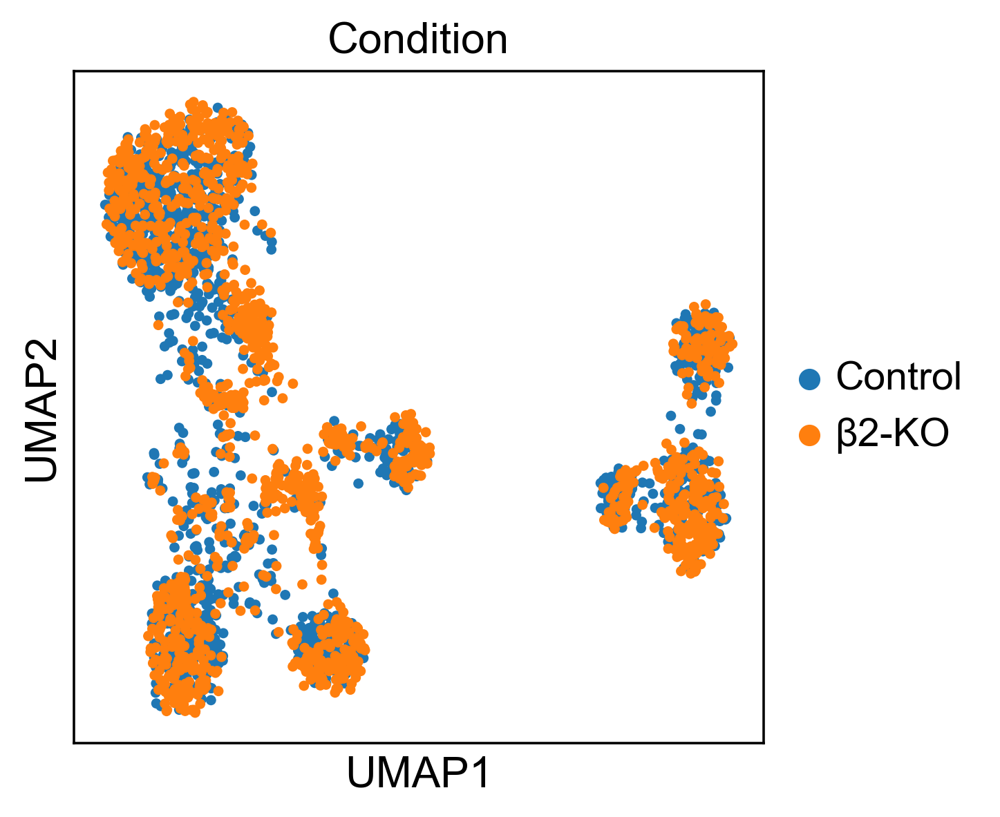

In [98]:
sc.pl.umap(adata_combined_DS_pruned, color='Condition')

In [99]:
cluster_order = ['0', '3', '4', '1', '5', '8', '9', '10', '11', '12', '2', '6', '7']

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


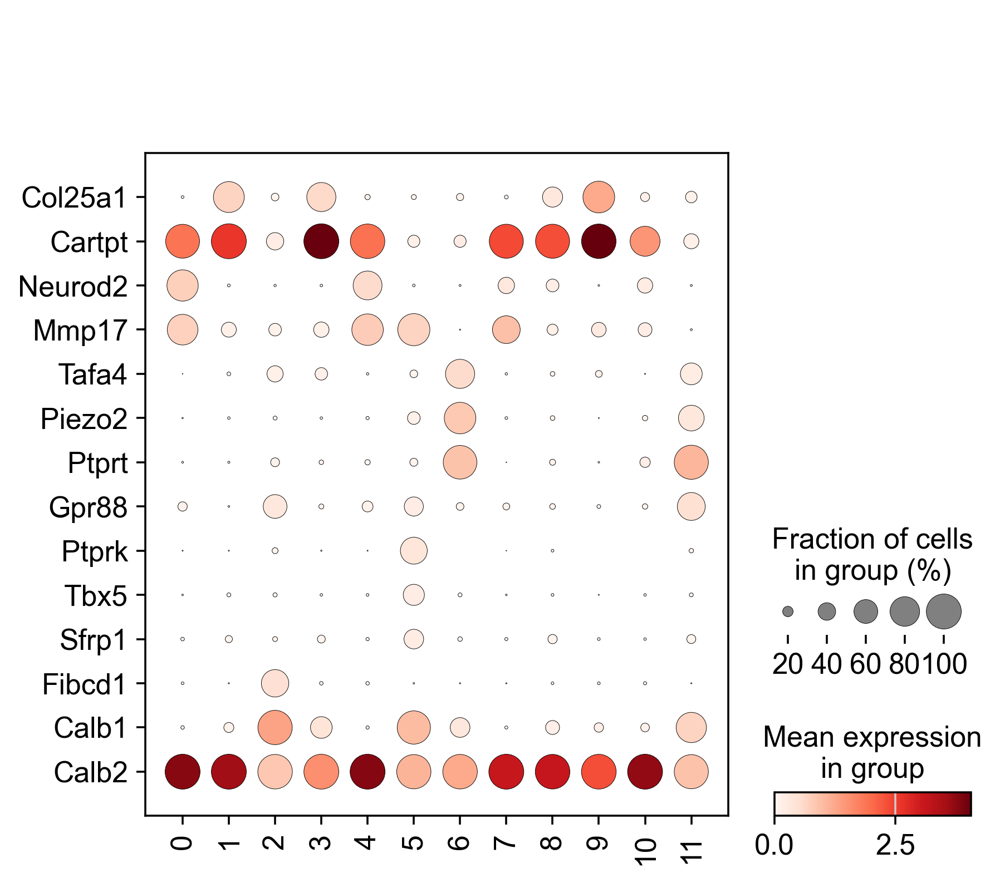

In [100]:
sc.pl.dotplot(adata_combined_DS_pruned, DS_markers, 'leiden', swap_axes=True)

In [101]:
adata_combined_DS_pruned2 = adata_combined_DS_pruned[~adata_combined_DS_pruned.obs['leiden'].isin(['10'])]

In [102]:
run_umap(adata_combined_DS_pruned2)

computing PCA
    with n_comps=50


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
Reach convergence after 9 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


In [103]:
sc.tl.leiden(adata_combined_DS_pruned2, resolution=2)

running Leiden clustering
    finished: found 17 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


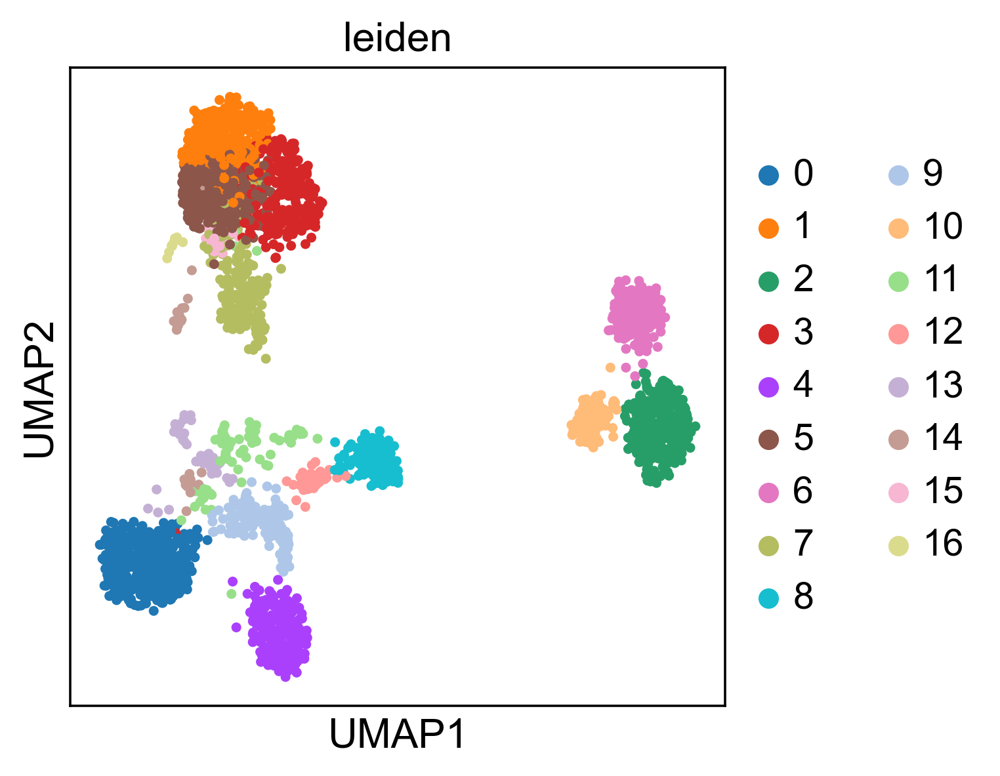

In [104]:
sc.pl.umap(adata_combined_DS_pruned2, color='leiden')

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


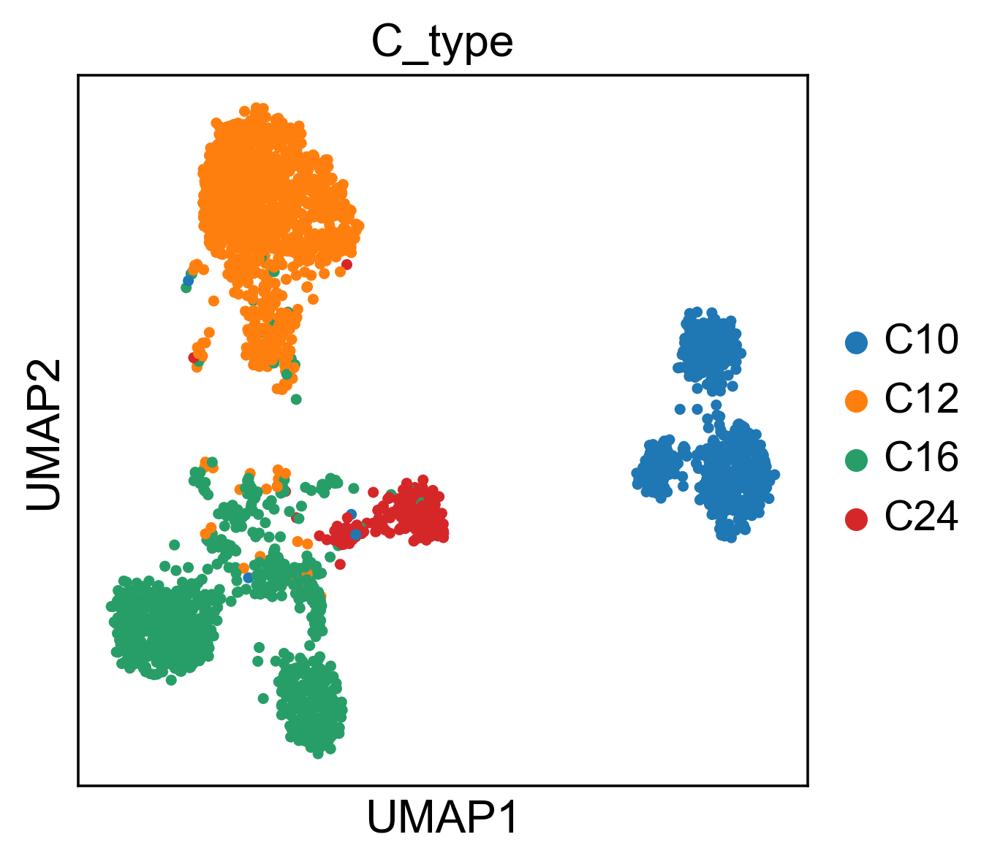

In [105]:
sc.pl.umap(adata_combined_DS_pruned2, color='C_type')

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


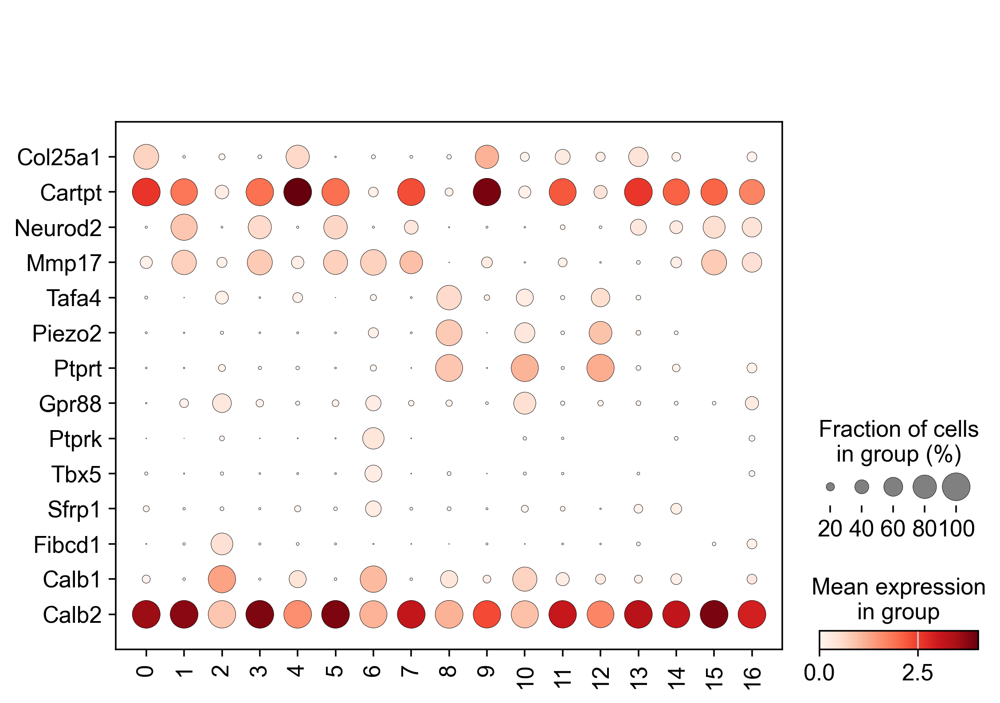

In [106]:
sc.pl.dotplot(adata_combined_DS_pruned2, DS_markers, 'leiden', swap_axes=True)

In [122]:
C12_clusters = ['1', '3', '5', '7', '15']
C16_V_clusters = ['0', '9']
C16_D_clusters = ['4']
C24_clusters = ['8', '12']
C10_D_clusters = ['6']
C10_V_clusters = ['2']
C10_T_clusters = ['10']

In [123]:
bio_type_list = []
for i in adata_combined_DS_pruned2.obs['leiden']:
    if i in C12_clusters:
        bio_type_list.append('N-ON/OFF')
    elif i in C16_V_clusters:
        bio_type_list.append('V-ON/OFF')
    elif i in C16_D_clusters:
        bio_type_list.append('D-ON/OFF')
    elif i in C24_clusters:
        bio_type_list.append('T-ON/OFF')
    elif i in C10_D_clusters:
        bio_type_list.append('D-ON')
    elif i in C10_V_clusters:
        bio_type_list.append('V-ON')
    elif i in C10_T_clusters:
        bio_type_list.append('N-ON')
    else:
        bio_type_list.append('Prune')

In [124]:
adata_combined_DS_pruned2.obs['DS_type'] = pd.Categorical(bio_type_list)

In [125]:
adata_combined_DS_final = adata_combined_DS_pruned2[adata_combined_DS_pruned2.obs['DS_type'] != 'Prune']

In [126]:
run_umap(adata_combined_DS_final)

computing PCA
    with n_comps=50


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
Reach convergence after 8 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)


In [237]:
sc.tl.leiden(adata_combined_DS_final)

running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [127]:
type_order = ['D-ON/OFF', 'V-ON/OFF', 'N-ON/OFF', 'T-ON/OFF', 'N-ON', 'D-ON', 'V-ON']

In [134]:
adata_combined_DS_final.obs['DS_type'] = adata_combined_DS_final.obs['DS_type'].cat.reorder_categories(type_order)

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


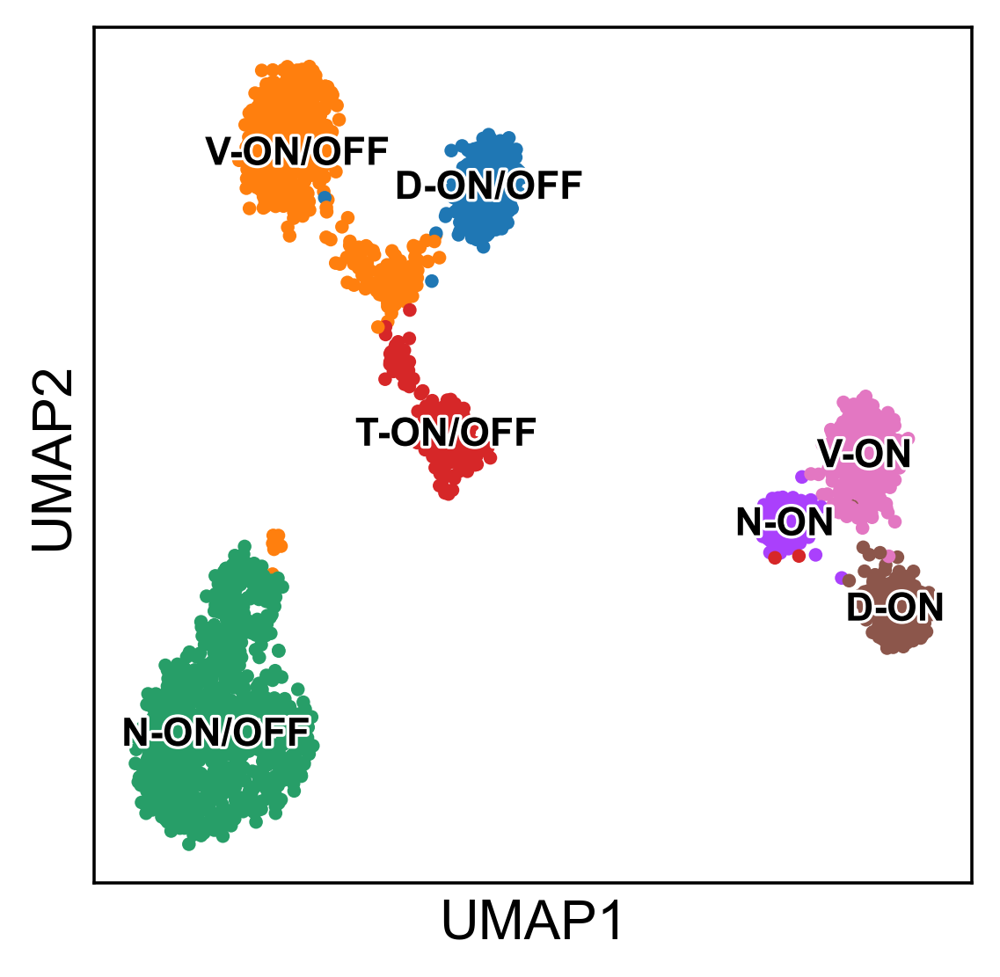

In [135]:
sc.set_figure_params(dpi=160,dpi_save=1000)
sc.pl.umap(adata_combined_DS_final, color='DS_type', legend_loc='on data', legend_fontoutline=1.5, legend_fontsize=10, title='', save='DS_umap.svg')

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


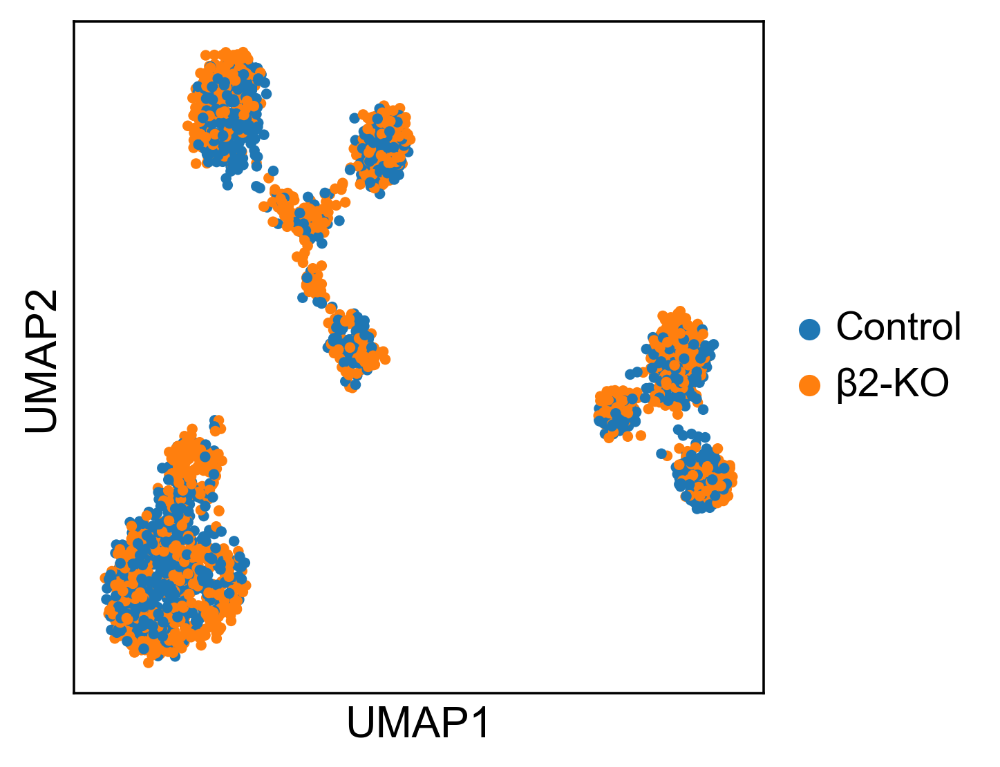

In [136]:
sc.set_figure_params(dpi=160,dpi_save=1000)
sc.pl.umap(shuffle(adata_combined_DS_final), color='Condition', title='', save='DS_umap_batches.svg')

In [115]:
sc.tl.rank_genes_groups(adata_combined_DS_final, 'DS_type', method='wilcoxon')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:12)


In [116]:
DS_DE_dfs = {}
for i in type_order:
    DS_DE_dfs[i] = sc.get.rank_genes_groups_df(adata_combined_DS_final, i, pval_cutoff=0.05).sort_values('logfoldchanges', ascending=False)

In [117]:
list(DS_DE_dfs['D-ON/OFF'].names).index('Col25a1')

2305

In [118]:
for i in type_order:
    print(list(DS_DE_dfs[i].names[:50]))

['9130024F11Rik', 'Neurod6', 'Ccer2', 'Lct', 'Calb2', 'Cpne2', 'Rbp7', 'Gm10631', 'Irx6', 'Cidea', 'Neurod2', 'Irx4', 'Cited1', 'Satb2', 'Cngb3', 'Ndrg1', 'Trhr', 'Lgals9', 'Irx5', 'Lmo1', 'Gpr149', 'Syndig1', 'Pde1c', 'Drd5', 'Evc2', 'Krt26', 'Cpne9', 'Phgdh', 'Kcna5', 'Htr2a', 'Irx2', 'Kcnip3', 'Trarg1', 'Klc3', 'Tcf4', 'Plce1', 'Kctd4', 'Msrb2', 'Vim', 'Cyp4v3', 'Ppp1r17', 'Rbpms2', 'Brinp3', 'Arhgef3', 'Atf5', 'Kctd8', 'Chrna6', 'Rgs6', 'Crtac1', 'Trp53i11']
['Adora2a', 'Csrp3', 'Fam129a', 'Tec', 'Tcf7l2', 'Dkk2', 'Ptgs1', 'Nfib', 'Cbln4', 'Mn1', 'Col25a1', 'Slc7a3', 'Shisal2b', 'Zeb2', 'Gpc6', 'Cdh10', 'Pcdh11x', 'Gm17750', 'Adgrg6', 'A730049H05Rik', 'Slitrk6', 'Tiparp', 'Lnp1', 'Tpbg', 'Anxa3', 'Htr5b', 'Elovl3', 'Rgs5', 'Tac1', 'Cxcl13', 'Gm26569', 'Sh3bp4', 'Crhbp', 'Scg2', 'Igsf11', 'Tcerg1l', 'Fgfr2', 'Cartpt', 'Samd4', 'Thrb', 'Cpne4', 'Egflam', 'Grin3a', 'Gm11549', 'Rhox4c', 'Gm32736', 'Cntn5', 'Aldh1a3', 'Trpc5', 'Wdr66']
['Shisa3', 'Fibcd1', 'Cxcr4', 'Col10a1', 'Gfi1', 'C

In [268]:
DS_markers = []
for j in DS_DE_dfs['D-ON'].names[:50]:
    DS_markers.append(j)

In [271]:
DS_markers = ['Cartpt', 'Col25a1', 'Pcdh11x', 'Fgd2', 'Dapl1', 'Ildr2', 'Zeb2', 'Gpc6', 'Neurod2', 'Mmp17', 'Trhr', 'Neurod2', 'Cidea', 'Kcnip3', 'Ccer2', 'Ndrg1', 'Irx4', 'Satb2', 'Irx6', 'Ptgfr', 'Tafa4', 'Scn7a', 'Piezo2', 'Ptprt', 'Gpr88', 'Syt6', 'Npy', 'Lbhd2', 'Ceacam10', 'Ptprk', 'Onecut3', 'Avil', 'Tbx5', 'Sfrp1', 'Shox2', 'Eya1', 'Shisa3', 'Cxcr4', 'Fibcd1', 'Gfi1']

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


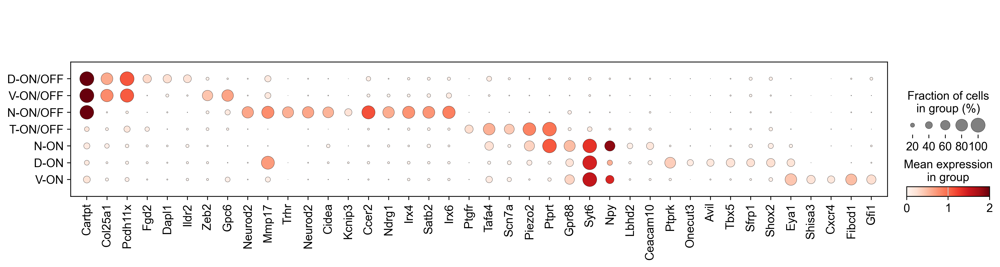

In [272]:
sc.pl.dotplot(adata_combined_DS_final, DS_markers, 'DS_type', categories_order=type_order, vmax=2, save='DS_markers.svg')

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


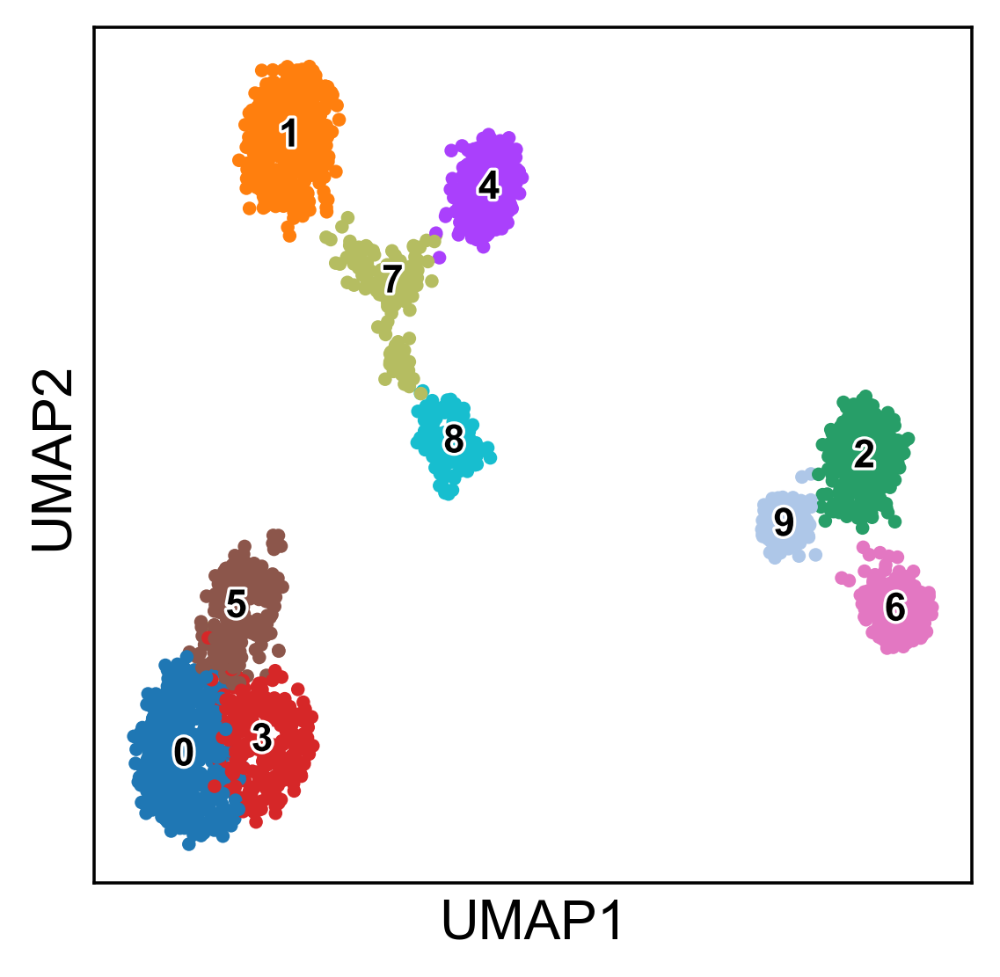

In [241]:
sc.set_figure_params(dpi=160,dpi_save=1000)
sc.pl.umap(adata_combined_DS_final, color='leiden', legend_loc='on data', legend_fontoutline=1.5, legend_fontsize=10, title='')

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


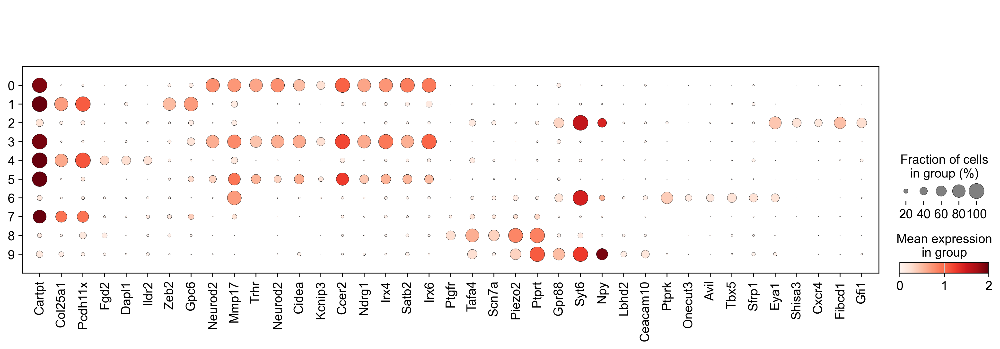

In [243]:
sc.pl.dotplot(adata_combined_DS_final, DS_markers, 'leiden', vmax=2)

In [244]:
adata_combined_DS_final_real = adata_combined_DS_final[adata_combined_DS_final.obs['leiden'] != '7']

In [248]:
bio_type_list = []
for i in adata_combined_DS_final_real.obs['leiden']:
    if i in ['0', '3', '5']:
        bio_type_list.append('N-ON/OFF')
    elif i in ['1']:
        bio_type_list.append('V-ON/OFF')
    elif i in ['4']:
        bio_type_list.append('D-ON/OFF')
    elif i in ['8']:
        bio_type_list.append('T-ON/OFF')
    elif i in ['6']:
        bio_type_list.append('D-ON')
    elif i in ['2']:
        bio_type_list.append('V-ON')
    elif i in ['9']:
        bio_type_list.append('N-ON')
adata_combined_DS_final_real.obs['DS_type'] = pd.Categorical(bio_type_list)

In [249]:
run_umap(adata_combined_DS_final_real)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
Reach convergence after 9 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


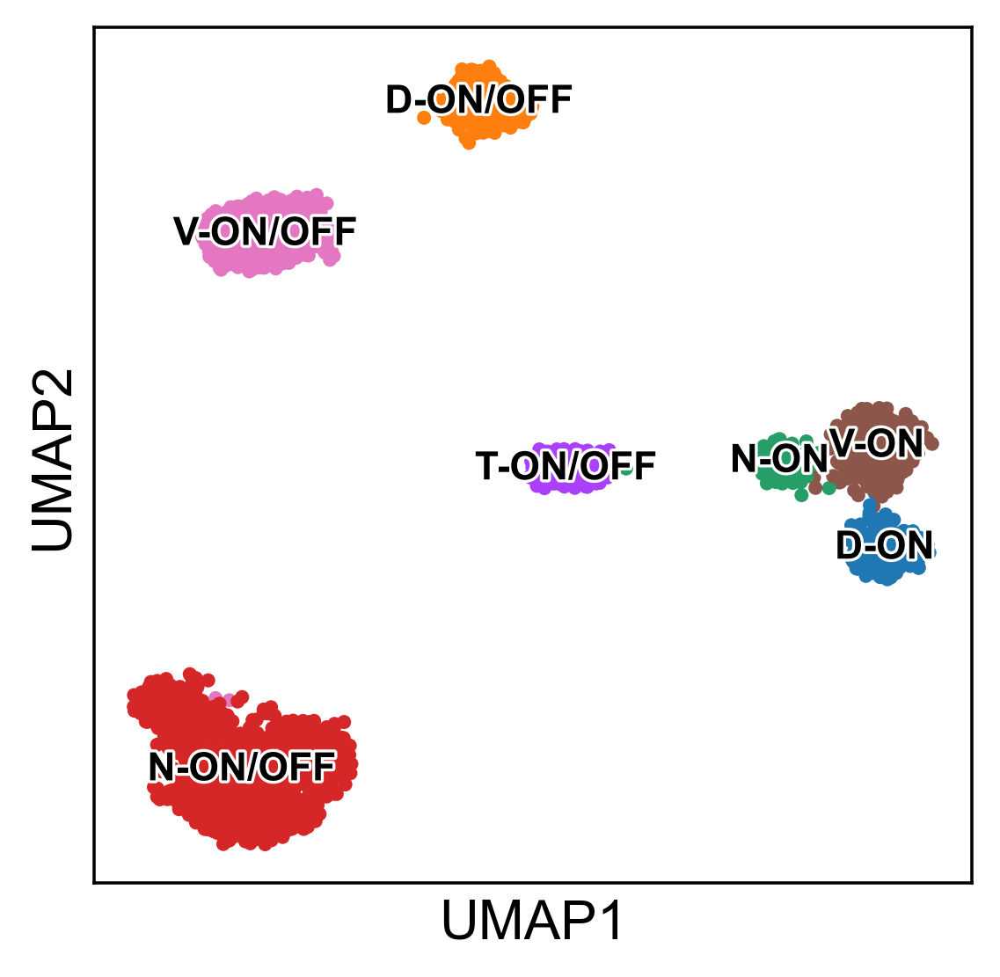

In [250]:
sc.set_figure_params(dpi=160,dpi_save=1000)
sc.pl.umap(adata_combined_DS_final_real, color='DS_type', legend_loc='on data', legend_fontoutline=1.5, legend_fontsize=10, title='', save='DS_umap.svg')

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


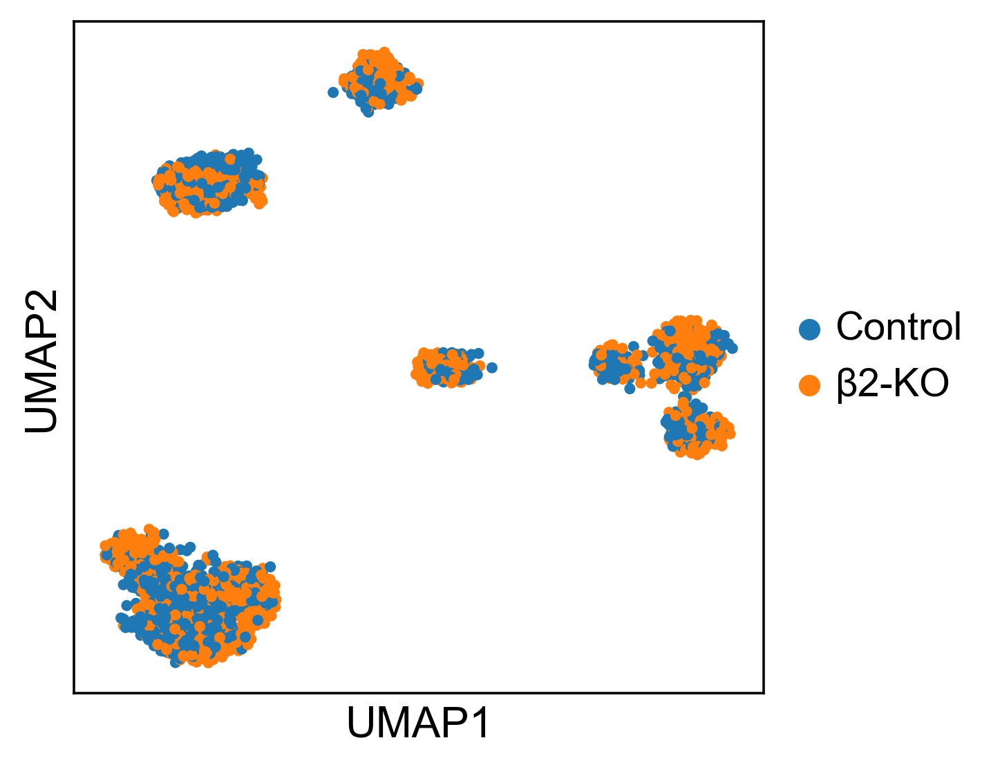

In [251]:
sc.set_figure_params(dpi=160,dpi_save=1000)
sc.pl.umap(shuffle(adata_combined_DS_final_real), color='Condition', title='', save='DS_umap_batches.svg')

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


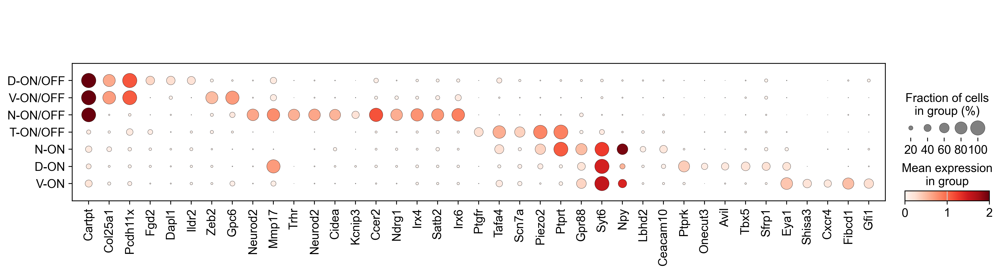

In [252]:
sc.pl.dotplot(adata_combined_DS_final_real, DS_markers, 'DS_type', categories_order=type_order, vmax=2, save='DS_markers.svg')

In [6]:
adata_p56 = sc.read_h5ad('adatas/P56_adata.h5ad')
adata_p5 = sc.read_h5ad('adatas/P5_adata_typed.h5ad')

In [7]:
adata_p56_DS = adata_p56[adata_p56.obs['Bio_type_cluster'].isin(['12', '16', '24', '10'])]
adata_p5_DS = adata_p5[adata_p5.obs['P56_type'].isin([12, 16, 24, 10])]

In [8]:
run_umap(adata_p56_DS)

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:01)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:04)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


In [16]:
sc.tl.leiden(adata_p56_DS, resolution=2)

running Leiden clustering
    finished: found 19 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


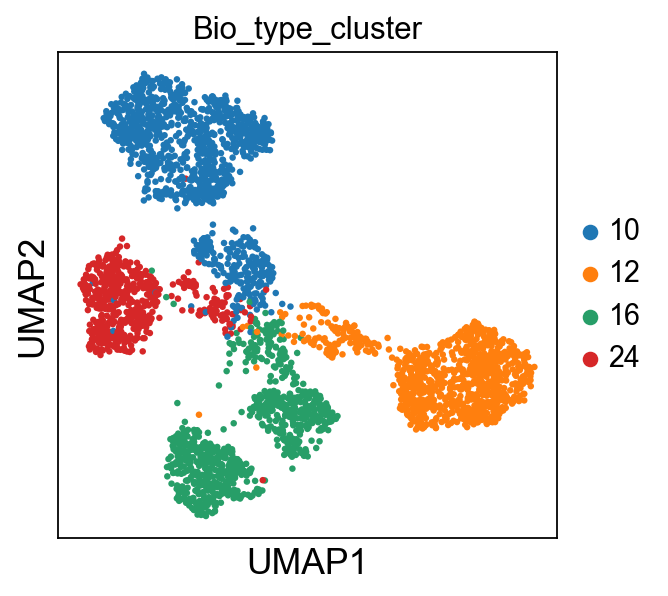

In [17]:
sc.pl.umap(adata_p56_DS, color='Bio_type_cluster')

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


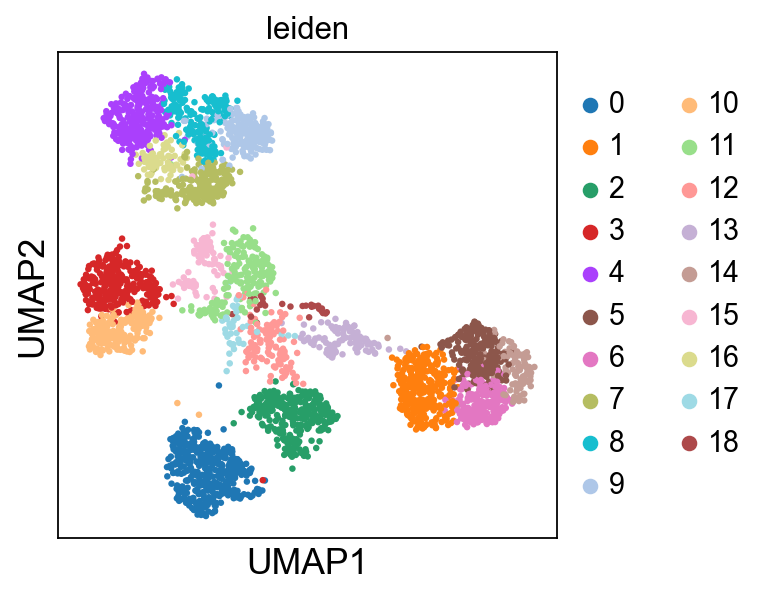

In [18]:
sc.pl.umap(adata_p56_DS, color='leiden')

In [19]:
DS_markers_p56 = ['Cartpt', 'Col25a1', 'Pcdh11x', 'Fgd2', 'Dapl1', 'Ildr2', 'Zeb2', 'Gpc6', 'Neurod2', 'Mmp17', 'Trhr', 'Neurod2', 'Cidea', 'Kcnip3', 'Ccer2', 'Ndrg1', 'Irx4', 'Satb2', 'Irx6', 'Ptgfr', 'Fam19a4', 'Scn7a', 'Piezo2', 'Ptprt', 'Gpr88', 'Syt6', 'Npy', 'A230065H16Rik', 'Ceacam10', 'Ptprk', 'Onecut3', 'Avil', 'Tbx5', 'Sfrp1', 'Eya1', 'Shisa3', 'Cxcr4', 'Fibcd1', 'Gfi1']

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


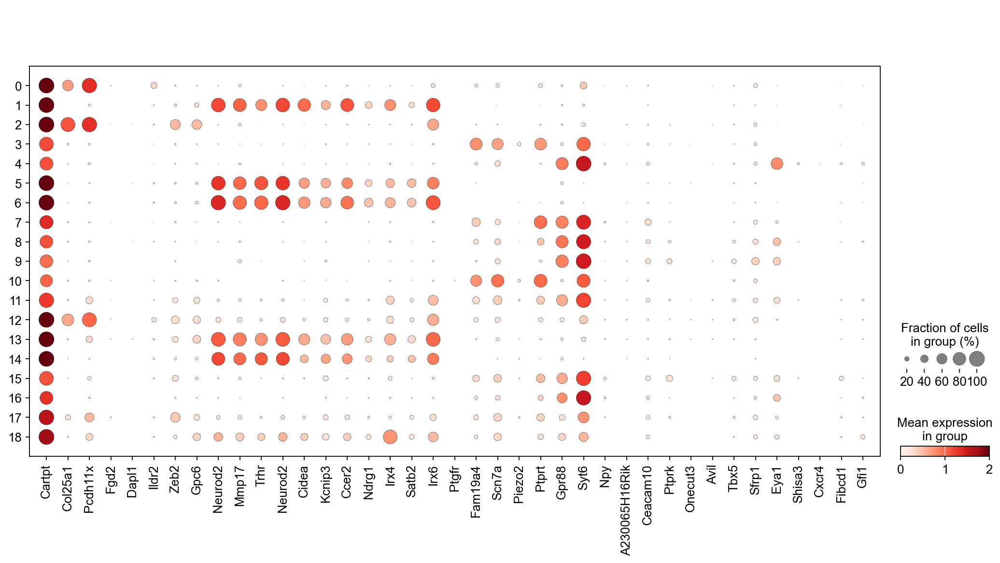

In [20]:
sc.pl.dotplot(adata_p56_DS, DS_markers_p56, 'leiden', vmax=2)

In [148]:
p56_D_OO = ['0']
p56_V_OO = ['2', '12']
p56_N_OO = ['1', '5', '6', '13', '14']
p56_T_OO = ['3', '10']
p56_O = ['4', '7', '8', '9', '16']

In [149]:
p56_DS_types = []
for i in adata_p56_DS.obs['leiden']:
    if i in p56_D_OO:
        p56_DS_types.append('D-ON/OFF')
    elif i in p56_V_OO:
        p56_DS_types.append('V-ON/OFF')
    elif i in p56_N_OO:
        p56_DS_types.append('N-ON/OFF')
    elif i in p56_T_OO:
        p56_DS_types.append('T-ON/OFF')
    elif i in p56_O:
        p56_DS_types.append('ON')
    else:
        p56_DS_types.append('Prune')
adata_p56_DS.obs['DS_type'] = pd.Categorical(p56_DS_types)

In [150]:
adata_p56_DS_pruned = adata_p56_DS[adata_p56_DS.obs['DS_type'] != 'Prune']

In [151]:
run_umap(adata_p56_DS_pruned)

computing PCA
    on highly variable genes


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    with n_comps=50
    finished (0:00:01)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


In [152]:
adata_p56_ON = adata_p56_DS_pruned[adata_p56_DS_pruned.obs['DS_type'] == 'ON']

In [161]:
sc.tl.leiden(adata_p56_ON, resolution=0.3)

running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


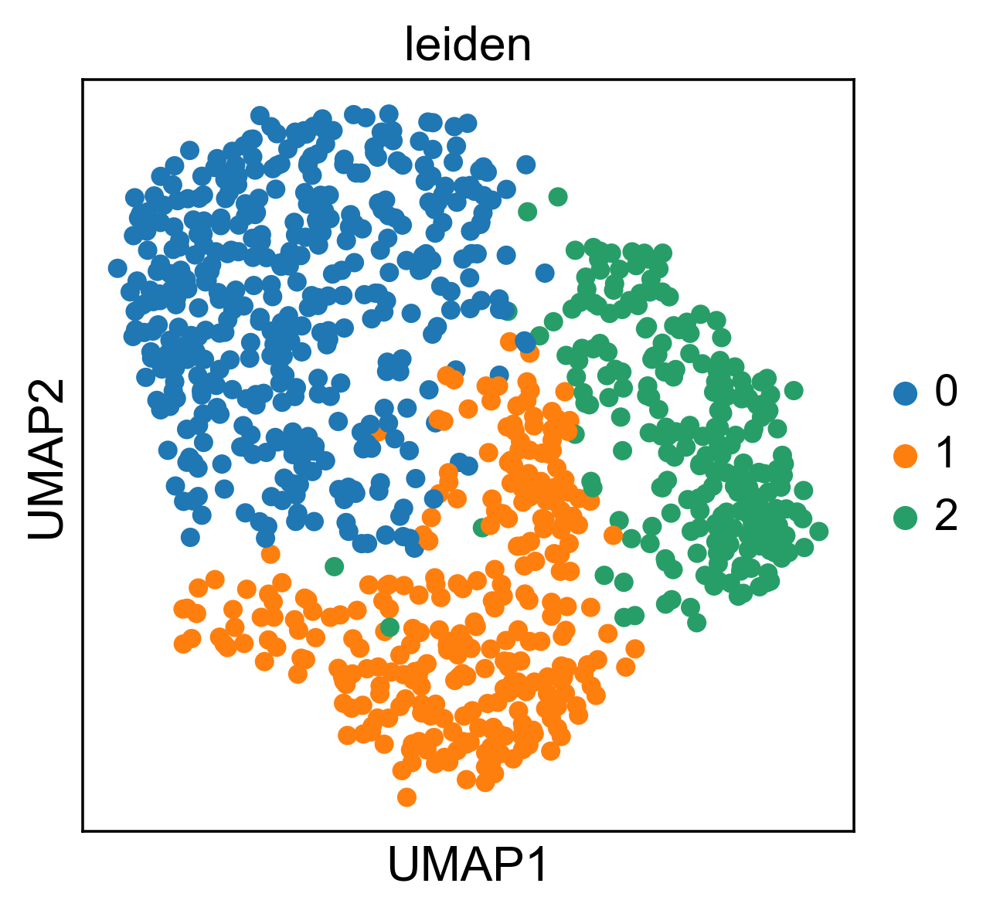

In [162]:
sc.pl.umap(adata_p56_ON, color='leiden')

In [163]:
p56_type_order = ['D-ON/OFF', 'V-ON/OFF', 'N-ON/OFF', 'T-ON/OFF', 'ON']

In [164]:
adata_p56_DS_pruned.obs['DS_type'] = adata_p56_DS_pruned.obs['DS_type'].cat.reorder_categories(p56_type_order)

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


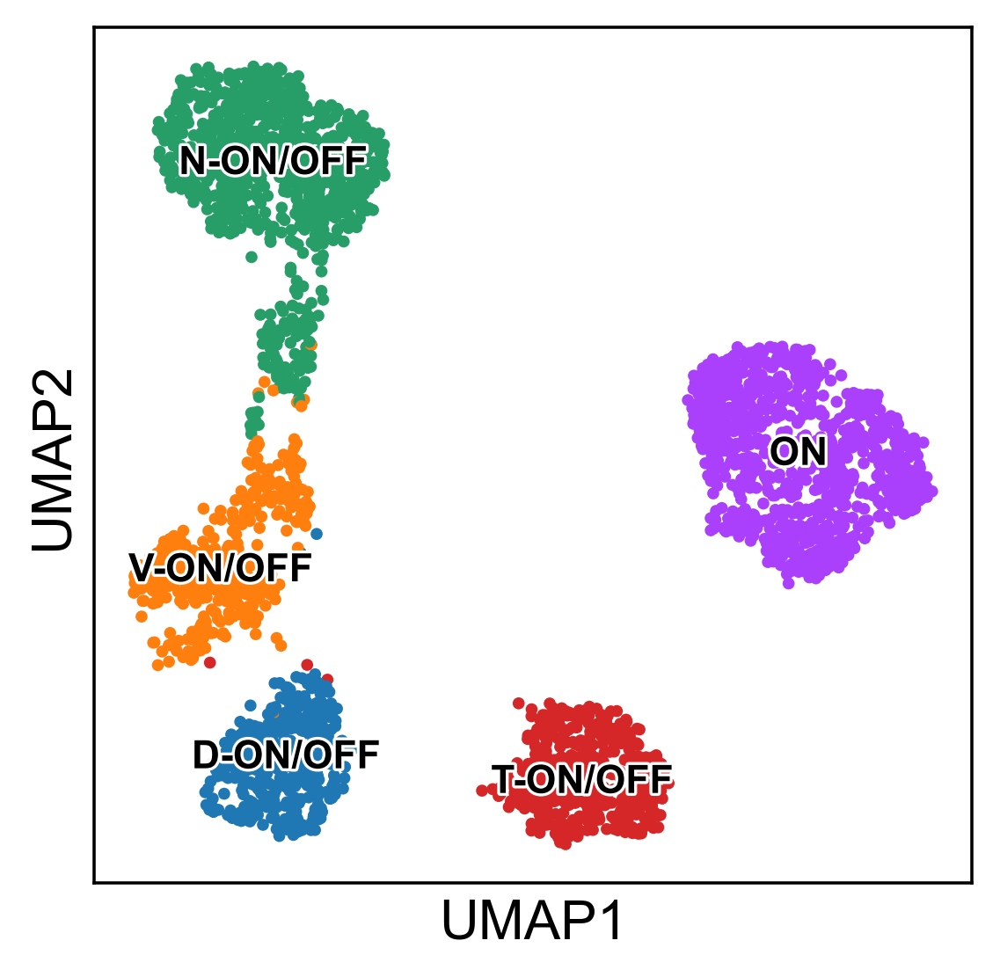

In [193]:
sc.pl.umap(adata_p56_DS_pruned, color='DS_type', legend_loc='on data', legend_fontoutline=1.5, legend_fontsize=10, title='', save='_p56_DS_umap.svg')

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


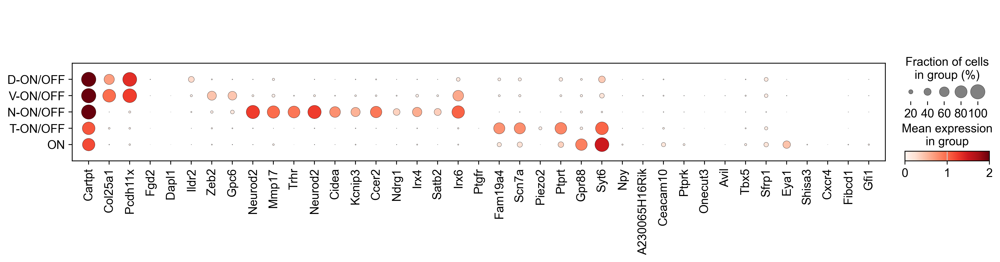

In [202]:
sc.pl.dotplot(adata_p56_DS_pruned, DS_markers_p56, 'DS_type', categories_order=p56_type_order, vmax=2, save='_p56_DS_markers.svg')

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


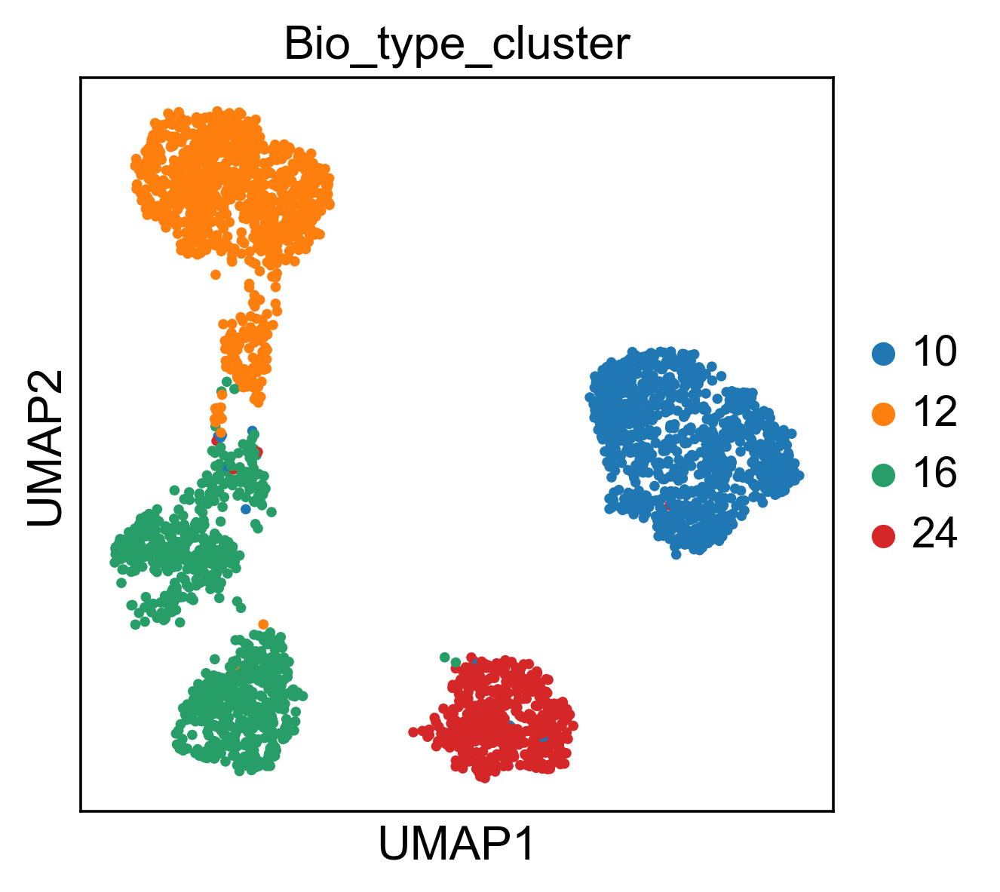

In [166]:
sc.pl.umap(adata_p56_DS_pruned, color='Bio_type_cluster')

In [167]:
run_umap(adata_p5_DS)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


In [168]:
sc.tl.leiden(adata_p5_DS, resolution=2)

running Leiden clustering
    finished: found 16 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


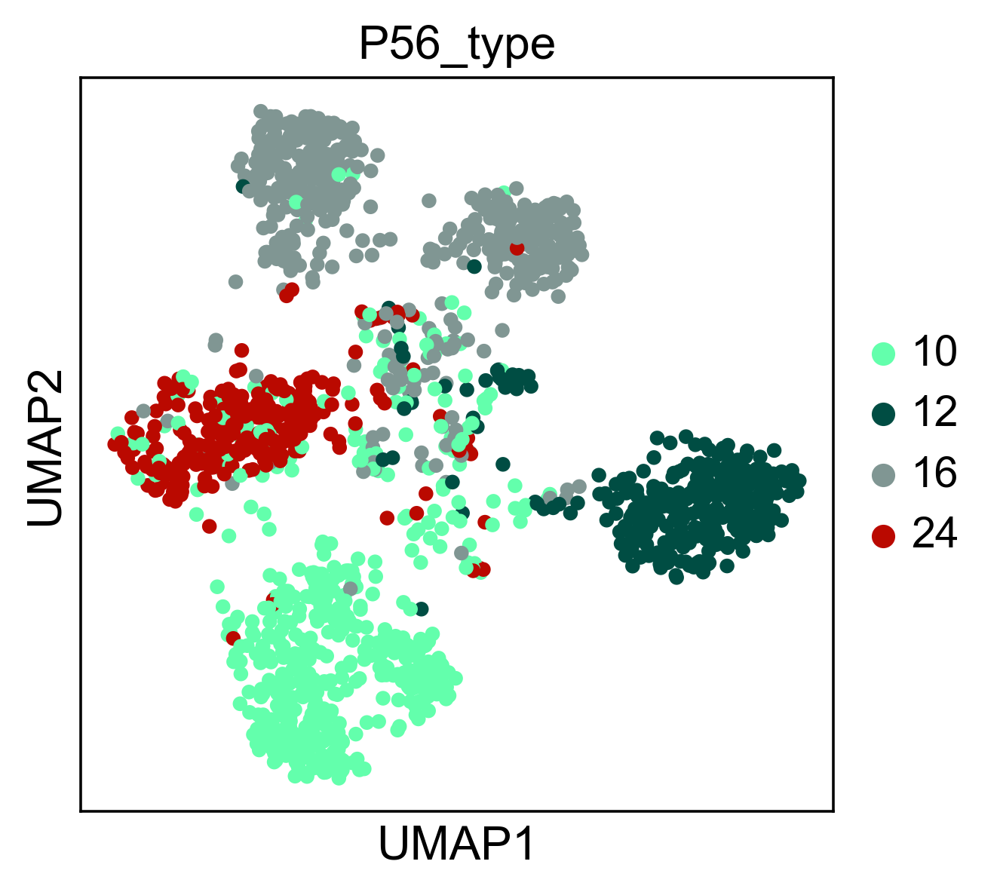

In [169]:
sc.pl.umap(adata_p5_DS, color='P56_type')

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


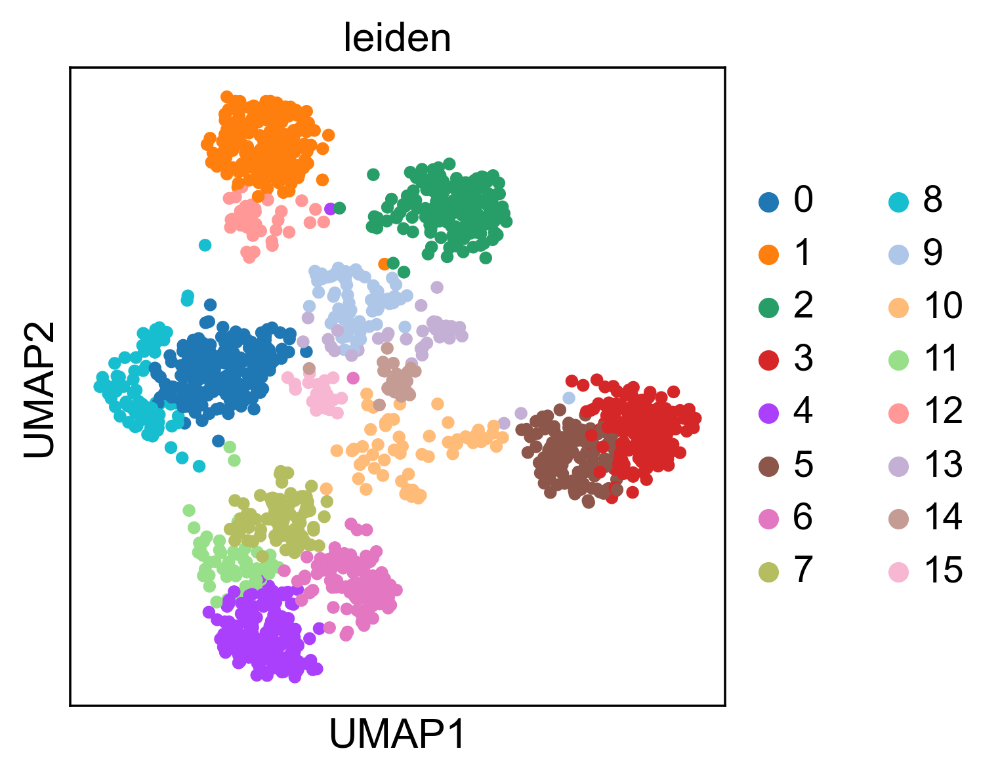

In [170]:
sc.pl.umap(adata_p5_DS, color='leiden')

In [183]:
DS_markers_p5 = ['Cartpt', 'Col25a1', 'Pcdh11x', 'Fgd2', 'Dapl1', 'Ildr2', 'Zeb2', 'Gpc6', 'Neurod2', 'Mmp17', 'Trhr', 'Neurod2', 'Cidea', 'Kcnip3', 'Ndrg1', 'Irx4', 'Satb2', 'Irx6', 'Ptgfr', 'Fam19a4', 'Scn7a', 'Piezo2', 'Ptprt', 'Gpr88', 'Syt6', 'Npy', 'A230065H16Rik', 'Ceacam10', 'Ptprk', 'Onecut3', 'Avil', 'Tbx5', 'Sfrp1', 'Eya1', 'Shisa3', 'Cxcr4', 'Fibcd1', 'Gfi1']

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


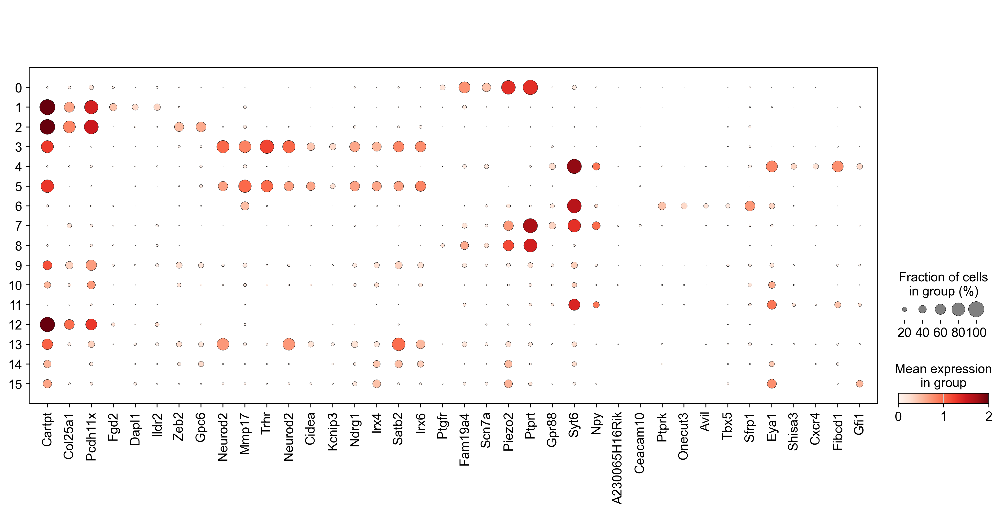

In [184]:
sc.pl.dotplot(adata_p5_DS, DS_markers_p5, 'leiden', vmax=2)

In [185]:
p5_D_OO = ['1', '12']
p5_V_OO = ['2']
p5_N_OO = ['3', '5']
p5_T_OO = ['0', '8']
p5_N_O = ['7']
p5_D_O = ['6']
p5_V_O = ['4', '11']

In [194]:
p5_DS_types = []
for i in adata_p5_DS.obs['leiden']:
    if i in p5_D_OO:
        p5_DS_types.append('D-ON/OFF')
    elif i in p5_V_OO:
        p5_DS_types.append('V-ON/OFF')
    elif i in p5_N_OO:
        p5_DS_types.append('N-ON/OFF')
    elif i in p5_T_OO:
        p5_DS_types.append('T-ON/OFF')
    elif i in p5_N_O:
        p5_DS_types.append('N-ON')
    elif i in p5_D_O:
        p5_DS_types.append('D-ON')
    elif i in p5_V_O:
        p5_DS_types.append('V-ON')
    else:
        p5_DS_types.append('Prune')
adata_p5_DS.obs['DS_type'] = pd.Categorical(p5_DS_types)

In [195]:
adata_p5_DS_pruned = adata_p5_DS[adata_p5_DS.obs['DS_type'] != 'Prune']

In [196]:
run_umap(adata_p5_DS_pruned)

computing PCA
    on highly variable genes
    with n_comps=50


C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


    finished (0:00:00)
	Initialization is completed.
	Completed 1 / 10 iteration(s).
	Completed 2 / 10 iteration(s).
	Completed 3 / 10 iteration(s).
	Completed 4 / 10 iteration(s).
	Completed 5 / 10 iteration(s).
	Completed 6 / 10 iteration(s).
	Completed 7 / 10 iteration(s).
	Completed 8 / 10 iteration(s).
	Completed 9 / 10 iteration(s).
	Completed 10 / 10 iteration(s).
Reach convergence after 10 iteration(s).
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


In [198]:
adata_p5_DS_pruned.obs['DS_type'] = adata_p5_DS_pruned.obs['DS_type'].cat.reorder_categories(type_order)

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_tools\scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


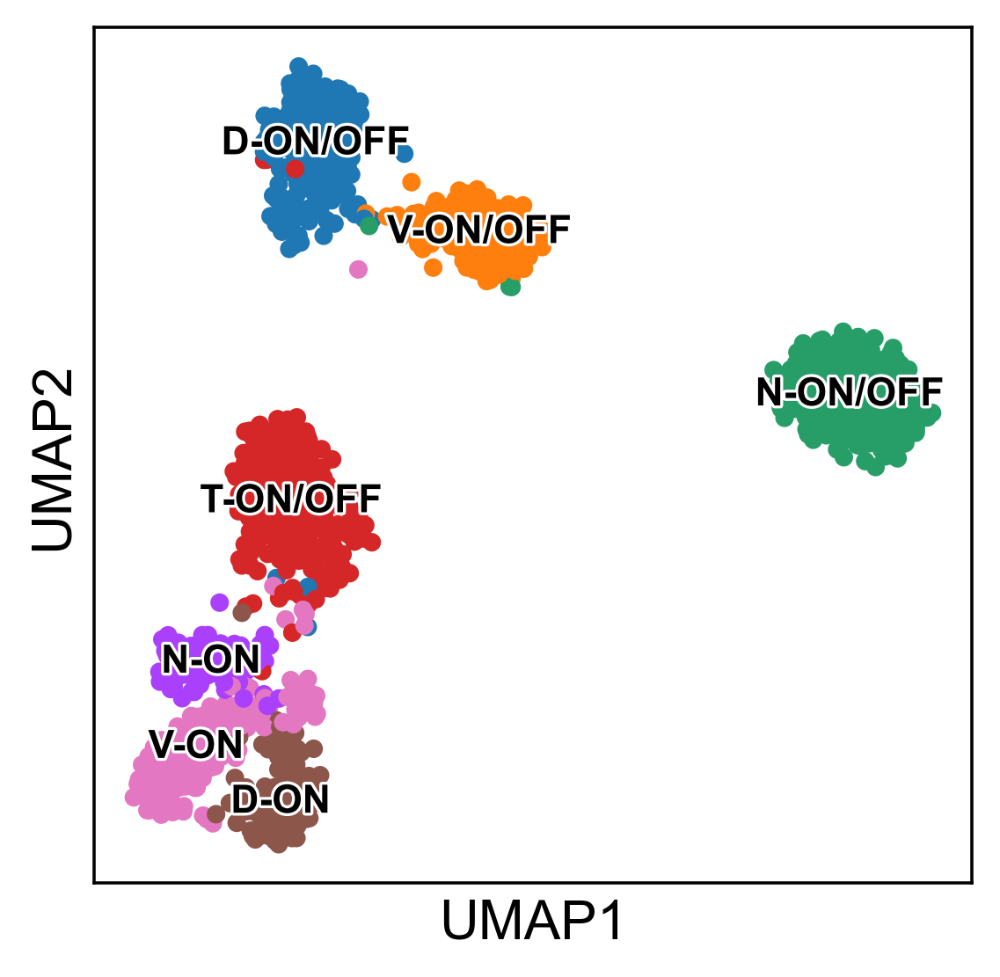

In [199]:
sc.pl.umap(adata_p5_DS_pruned, color='DS_type', legend_loc='on data', legend_fontoutline=1.5, legend_fontsize=10, title='', save='_p5_DS_umap.svg')

C:\Users\pomat\AppData\Local\Programs\Python\Python311\Lib\site-packages\scanpy\plotting\_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


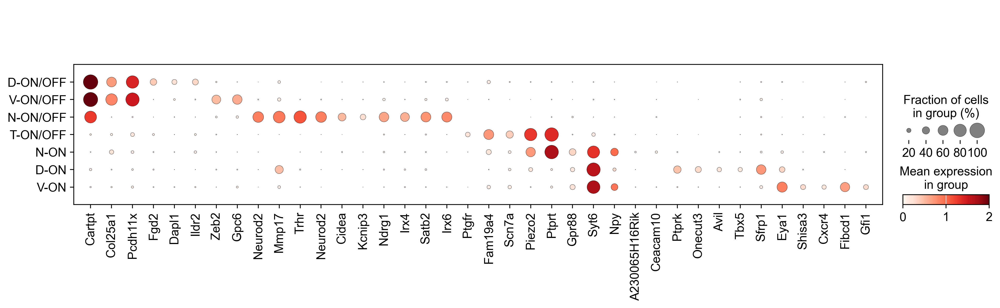

In [201]:
sc.pl.dotplot(adata_p5_DS_pruned, DS_markers_p5, 'DS_type', categories_order=type_order, vmax=2, save='_p5_DS_markers.svg')

In [257]:
adata_combined_DS_final.var['highly_variable'] = pd.DataFrame(len(adata_combined_DS_final.var)*[True], index=adata_combined_DS_final.var.index).astype('bool')

In [260]:
adata_combined_DS_final.write('adatas/p7_adata_DS.h5ad')

In [229]:
adata_p56_DS_pruned.write('adatas/p56_adata_DS.h5ad')

In [230]:
adata_p5_DS_pruned.write('adatas/p5_adata_DS.h5ad')